In [105]:
import os
import io
import sys
import random
import numpy as np
from PIL import Image
from PIL import ImageFilter
from scipy.ndimage import convolve
import matplotlib.pyplot as plt
from sklearn.preprocessing import normalize
from easing_functions import CubicEaseInOut
import pptx
from enum import Enum

if len(sys.argv) > 1:
    quizDirectory = sys.argv[1]
else:
    quizDirectory = "./images"
imageDirectory = quizDirectory
outputDirectory = "./"
rng = np.random.default_rng()

In [106]:
def edgeDetection(imgArray):
    edgeKernel = np.array([[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]])
    edgeMatrix = convolve(imgArray, edgeKernel)
    normalizedEdgeMatrix = edgeMatrix.clip(0, 255) / 255
    biasFunction = np.vectorize(CubicEaseInOut(0, 1, 1))
    return biasFunction(normalizedEdgeMatrix)

In [107]:
def centerBias(imgArray):
    xCenter = np.shape(imgArray)[0] / 2
    yCenter = np.shape(imgArray)[1] / 2
    maxDist = (xCenter ** 2 + yCenter ** 2) ** 0.5
    biasFunction = CubicEaseInOut(0, 0.5, maxDist*1.5)
    i, j = np.meshgrid(np.arange(imgArray.shape[0]), np.arange(imgArray.shape[1]), indexing="ij")
    
    @np.vectorize
    def distanceFromCenter(i, j):
        return biasFunction(maxDist - ((i-xCenter) ** 2 + (j-yCenter) ** 2) ** 0.5)
    
    return distanceFromCenter(i, j)

In [108]:
def consolidate(probabilityMatrix, shape, minProbPerc):
    sumKernel = np.ones(shape)
    consolidatedVector = convolve(probabilityMatrix, sumKernel, mode="constant", cval=0).flatten()
    consolidatedVector[consolidatedVector < (np.max(consolidatedVector) * minProbPerc)] = 0
    return consolidatedVector / np.sum(consolidatedVector)

In [109]:
def cutImage(img, shape, chunk, probabilityMatrix=None):
    imgArray = np.asarray(img)
    chunkCoordinates = np.unravel_index(chunk, imgArray.shape[:2])
    startX = int(max(chunkCoordinates[0] - (shape[0] - 1) / 2, 0))
    startY = int(max(chunkCoordinates[1] - (shape[1] - 1) / 2, 0))
    endX = int(min(startX + shape[0], imgArray.shape[0] - 1))
    endY = int(min(startY + shape[1], imgArray.shape[1] - 1))
    if probabilityMatrix is not None:
        probabilityMatrix[startX:endX, startY:endY] = 0
    if len(imgArray) == 3:
        return Image.fromarray(imgArray[startX:endX, startY:endY, :])
    else:
        return Image.fromarray(imgArray[startX:endX, startY:endY])


def cropImage(img, shape, chunk, probabilityMatrix=None):
    imgArray = np.asarray(img)
    chunkCoordinates = np.unravel_index(chunk, imgArray.shape[:2])
    maxX = imgArray.shape[0] - 1
    maxY = imgArray.shape[1] - 1
    startX = int(max(chunkCoordinates[0] - (shape[0] - 1) / 2, 0))
    startY = int(max(chunkCoordinates[1] - (shape[1] - 1) / 2, 0))
    endX = int(min(startX + shape[0], maxX))
    endY = int(min(startY + shape[1], maxY))
    if probabilityMatrix is not None:
        probabilityMatrix[startX:endX, startY:endY] = 0
    # cropValues = {
    #     "crop_bottom": (maxY - endY) / maxY,
    #     "crop_left": startX / maxX,
    #     "crop_right": (maxX - endX) / maxX,
    #     "crop_top": startY / maxY
    # }
    cropValues = {
        "crop_bottom": (maxX - endX) / maxX,
        "crop_left": startY / maxY,
        "crop_right": (maxY - endY) / maxY,
        "crop_top": startX / maxX
    }
    return cropValues

In [110]:
# def calcChunkShape(shape, divisor):
#     return tuple(np.asarray(np.add(np.multiply(np.divide(np.divide(shape, divisor), 2), 2), 1), dtype=np.int32))

def calcChunkShape(probabilityMatrix, cropIndex):
    goalArea = probabilityMatrix[probabilityMatrix > np.average(probabilityMatrix[probabilityMatrix > 0])].size / (10/((cropIndex+1)/2.25))
    width = int(round((random.random() * ((goalArea**0.5)*0.2) + (goalArea**0.5)*.9))/2)*2+1
    height = int(round(goalArea / width)/2)*2+1
    return width, height

In [111]:
class SlideType(Enum):
    TITLE = "Title"
    LOCATION = "Location"
    DUO = "Duo"
    WEAPON = "Weapon or Ability"
    POKEMON = "Pokemon"
    FAMOUS = "Famous Person"
    CARTOON = "Cartoon Character"
    CHARACTER = "Character"
    SCENE = "Scene"
    ARCHIVE = "The Archive"

animeString = "Anime"

def determineSlideType(imgName):
    for slideType in SlideType:
        if slideType.value.lower() in imgName.lower():
            return ((animeString + " ") if animeString in imgName else "") + slideType.value
    return None
    

In [112]:
quiz = pptx.Presentation()
quiz.slide_width = int(quiz.slide_height*(16/9))
titleSlide = quiz.slides.add_slide(quiz.slide_layouts[0])
title = titleSlide.shapes.title
title.text = "Hal Quiz"

topTemp = title.top
title.left = int((quiz.slide_width-title.width)/2)
title.top = topTemp

heightTemp = title.height
title.width = title.width
title.height = heightTemp

titleSlide.placeholders.element.remove(titleSlide.placeholders[1].element)

rulesSlide = quiz.slides.add_slide(quiz.slide_layouts[1])
rulesSlide.shapes.title.text = "Rules"
rulesSlide.shapes.title.text_frame.paragraphs[0].alignment = pptx.enum.text.PP_ALIGN.LEFT
rulesSlide.shapes.placeholders[1].text = "Categories (Indicated on each page):"
categoriesTextFrame = rulesSlide.shapes.placeholders[1].text_frame
categories = set()

In [113]:
def addImageInCenter(
    slide,
    img,
    cropChunk={"crop_bottom": 0, "crop_left": 0, "crop_right": 0, "crop_top": 0},
):
    imgWidth, imgHeight = img.size
    width = min(quiz.slide_height * (imgWidth / imgHeight), quiz.slide_width)
    widthRatio = 1 - cropChunk["crop_left"] - cropChunk["crop_right"]
    height = min(quiz.slide_width * (imgHeight / imgWidth), quiz.slide_height)
    heightRatio = 1 - cropChunk["crop_bottom"] - cropChunk["crop_top"]
    left = int((quiz.slide_width - width) / 2) + width * cropChunk["crop_left"]
    top = int((quiz.slide_height - height) / 2) + height * cropChunk["crop_top"]
    with io.BytesIO() as output:
        img.save(output, format="PNG")
        picture = slide.shapes.add_picture(
            output, left=left, top=top, width=width*widthRatio, height=height*heightRatio
        )
    picture.crop_bottom = cropChunk["crop_bottom"]
    picture.crop_left = cropChunk["crop_left"]
    picture.crop_right = cropChunk["crop_right"]
    picture.crop_top = cropChunk["crop_top"]


def addSlideLabel(slide, slideName):
    index = quiz.slides.index(slide)
    label = slide.shapes.add_textbox(
        left=0,
        top=0,
        width=int(quiz.slide_width / 8),
        height=int(quiz.slide_height / 10),
    )
    if slideName is not None:
        label.text = slideName
        label.text_frame.add_paragraph().text = str(index - 1)
    else:
        label.text = str(index - 1)

Pokemon Ivy.jpg


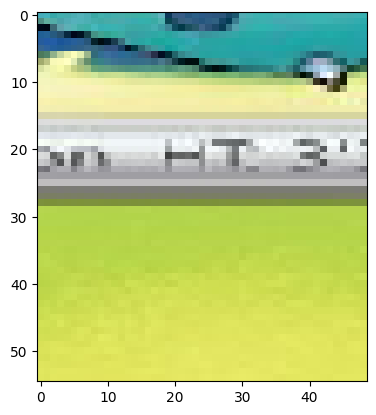

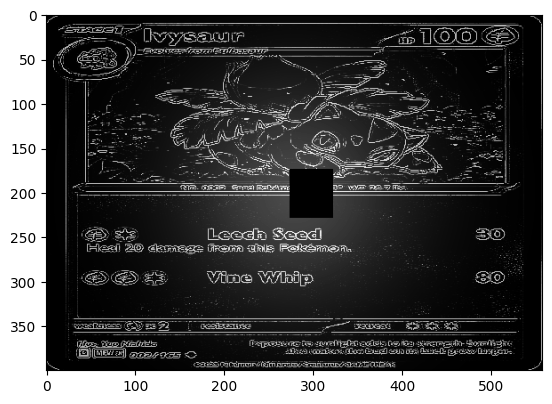

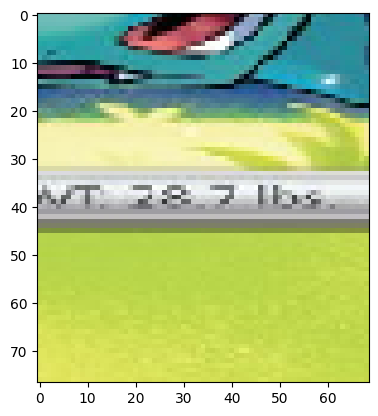

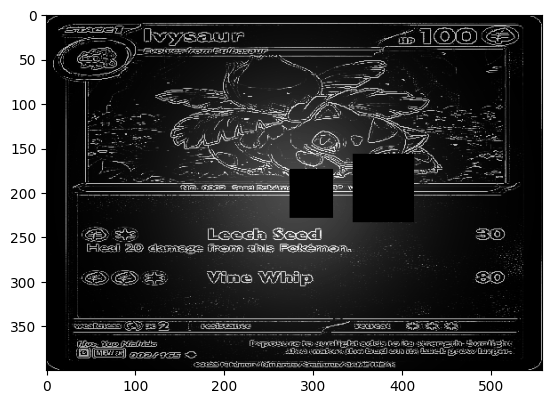

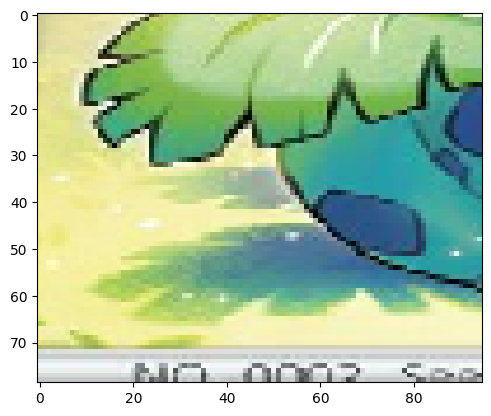

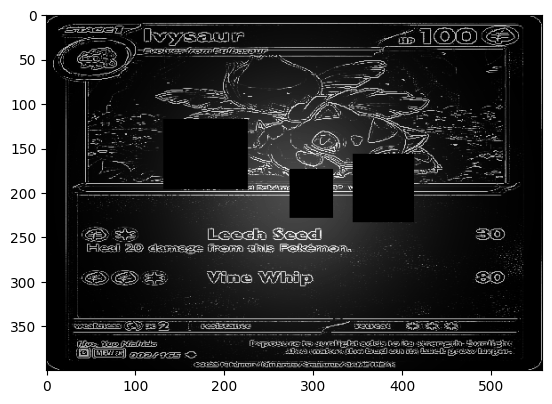

Famous Person WA.jpg


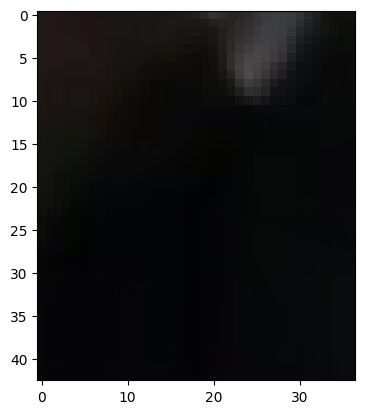

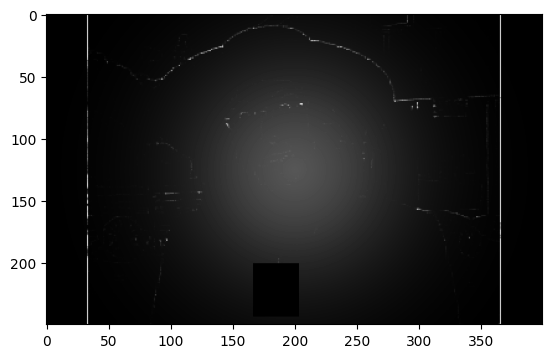

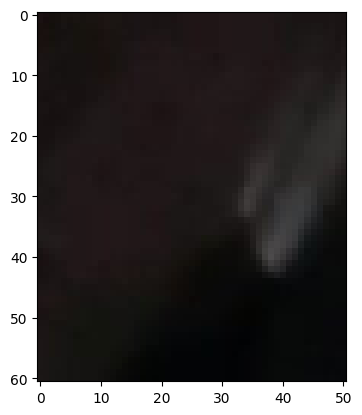

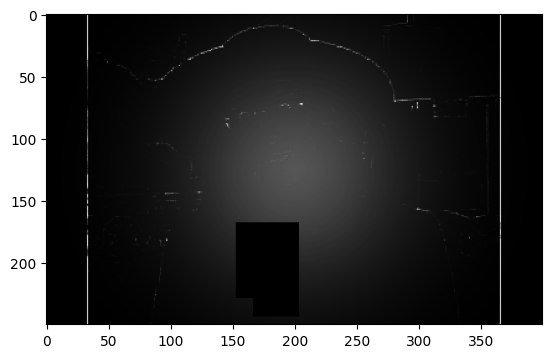

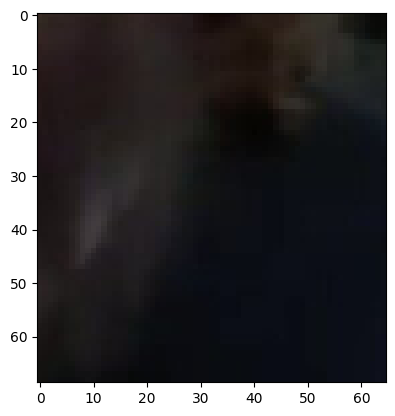

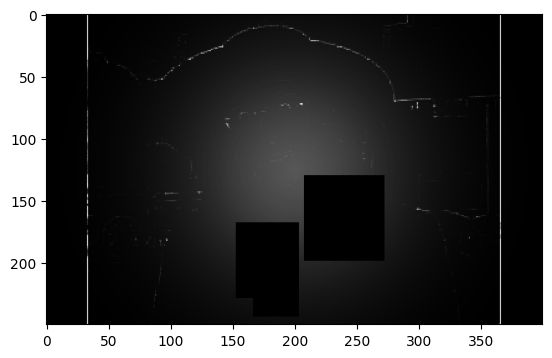

Scene Me.png


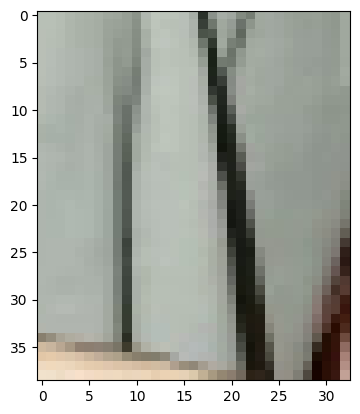

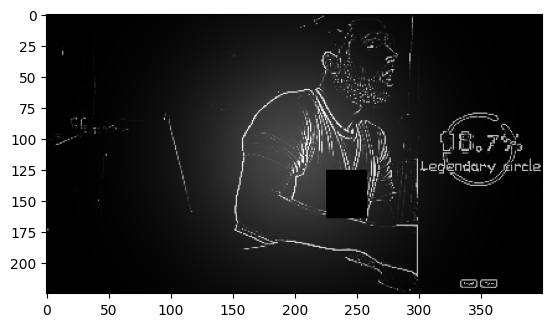

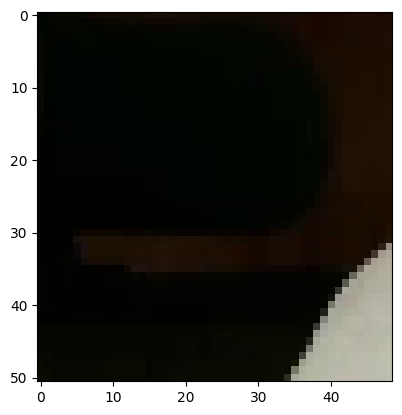

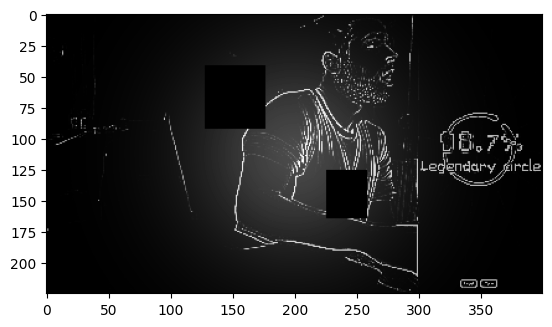

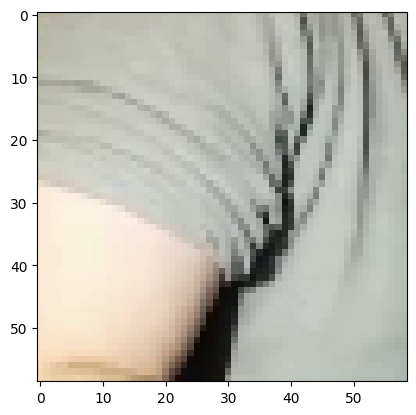

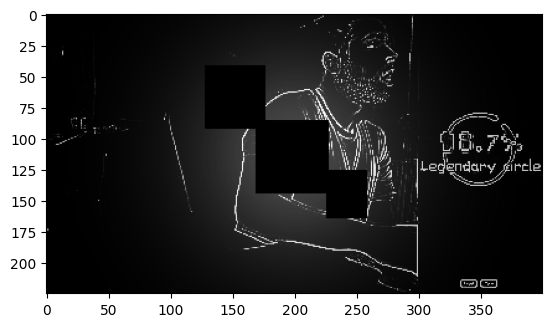

Cartoon Character CB.jpg


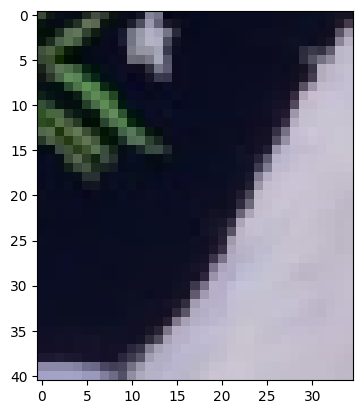

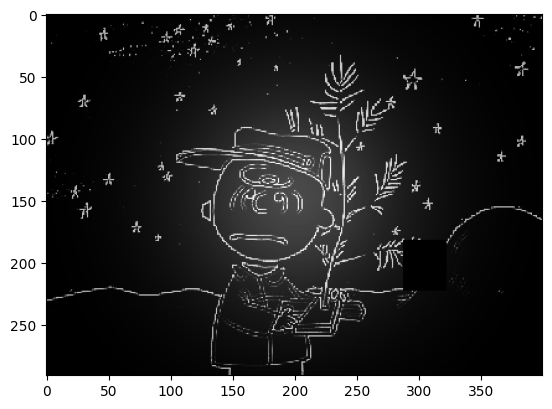

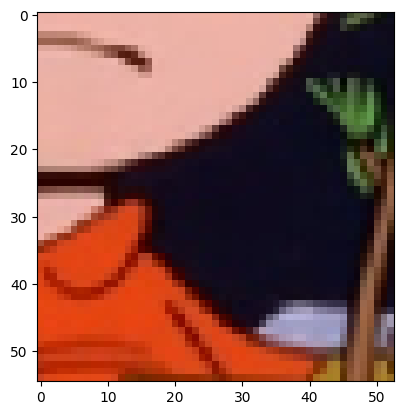

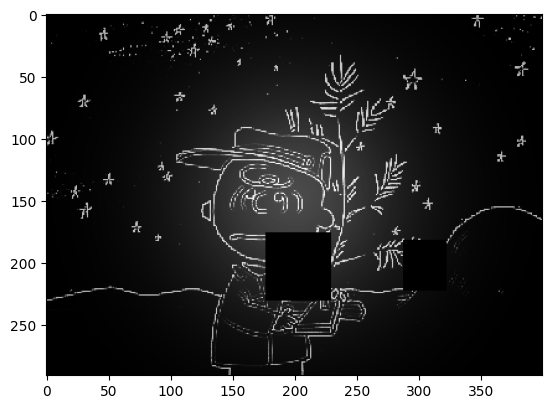

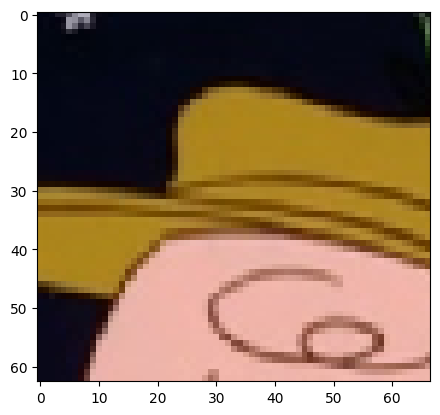

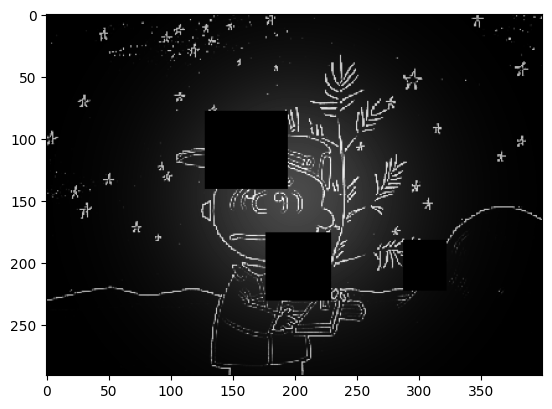

The Archive ZR.jpg


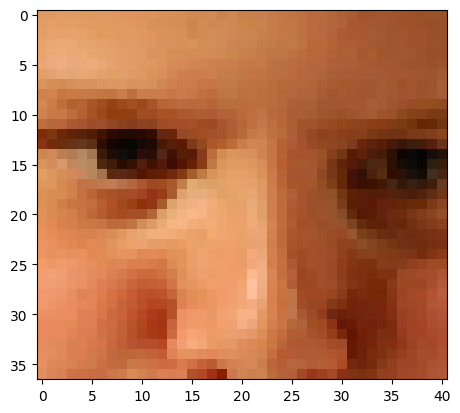

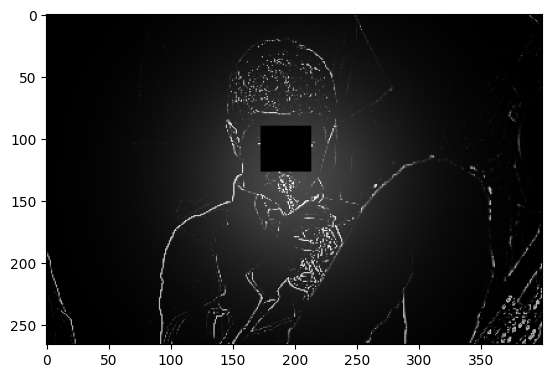

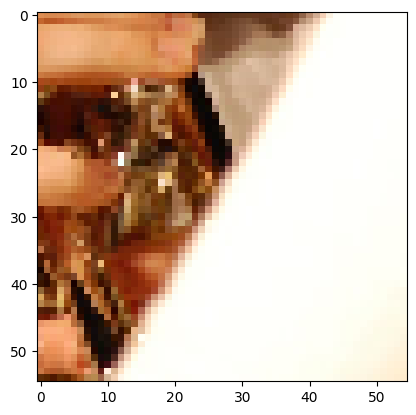

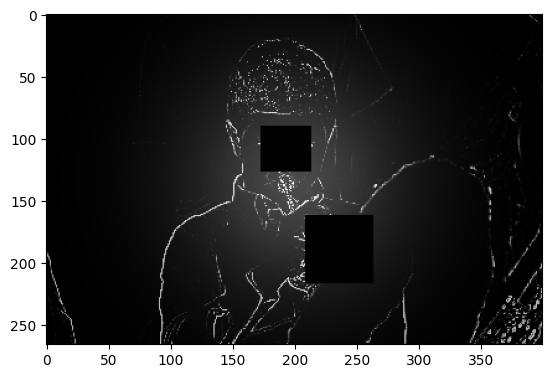

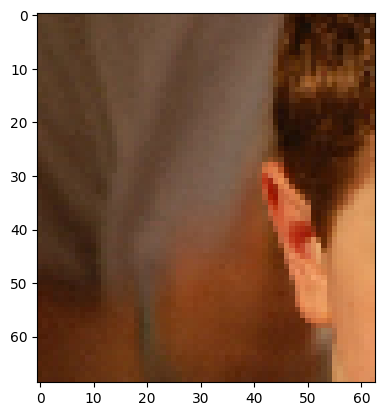

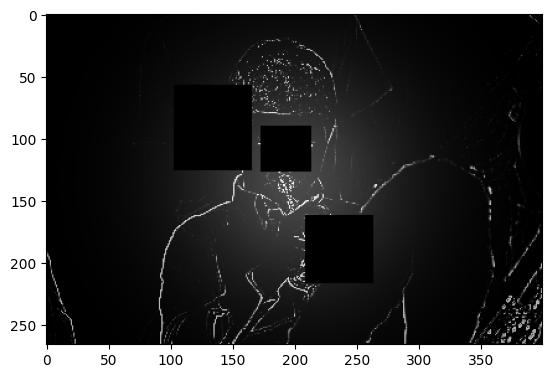

Cartoon Character SH.jpg


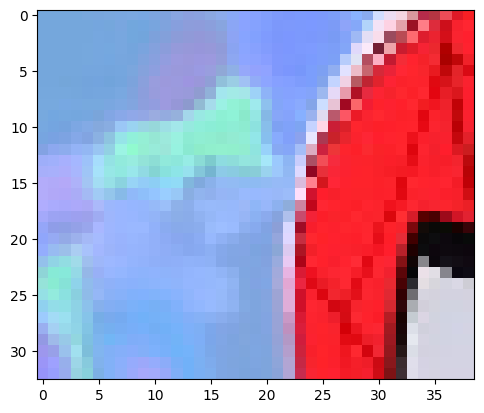

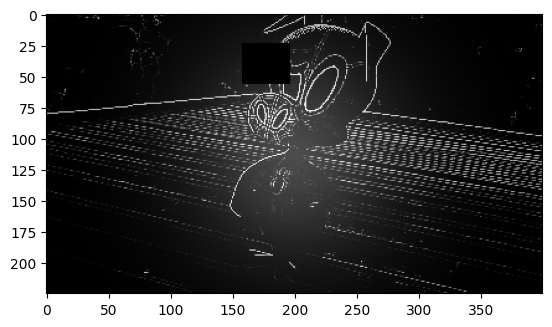

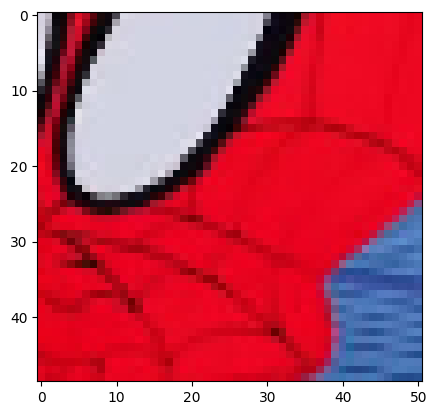

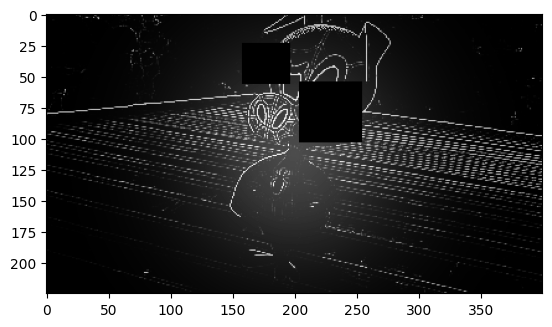

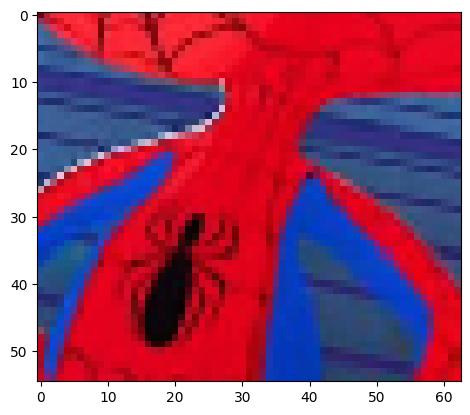

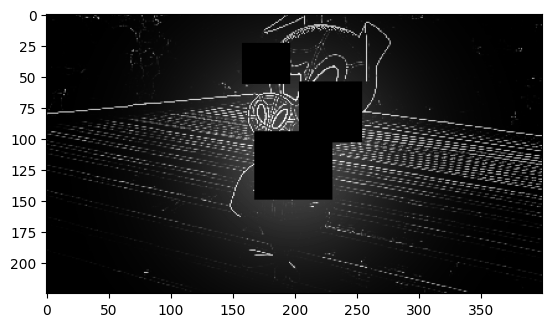

Famous Person JC.jpg


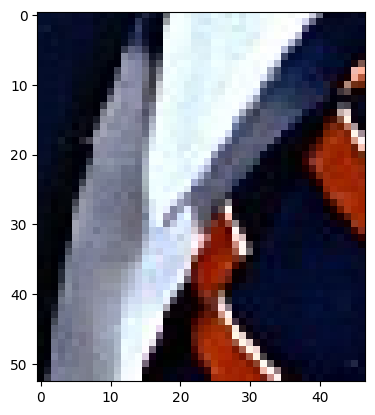

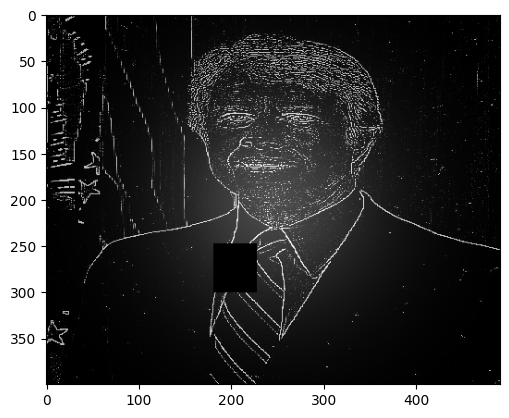

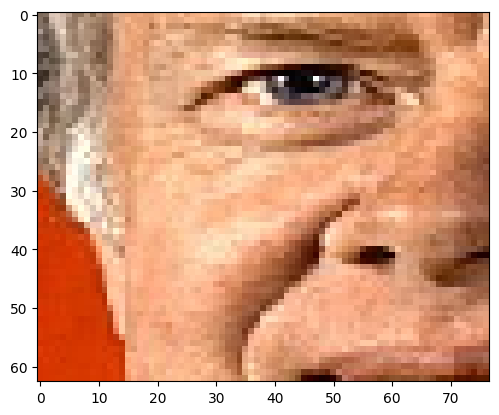

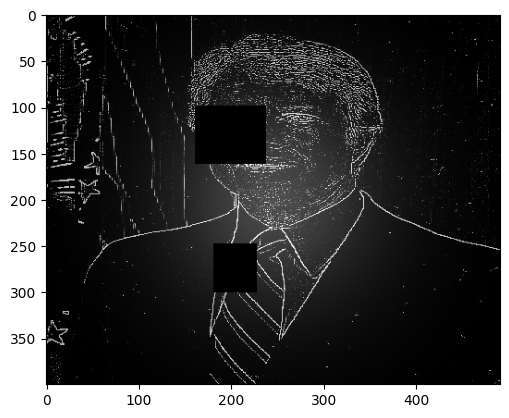

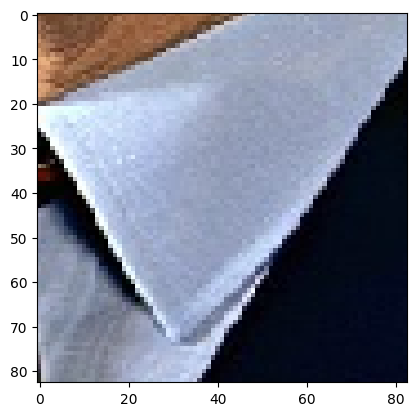

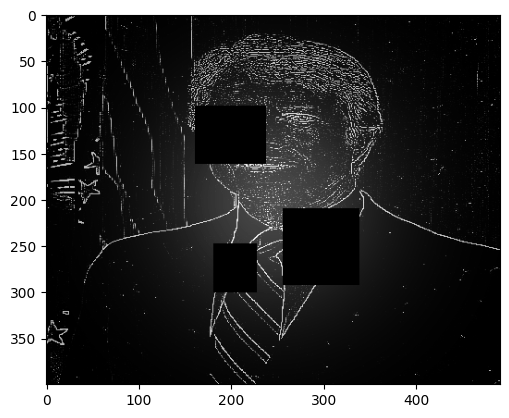

Famous Person MBC.jpg


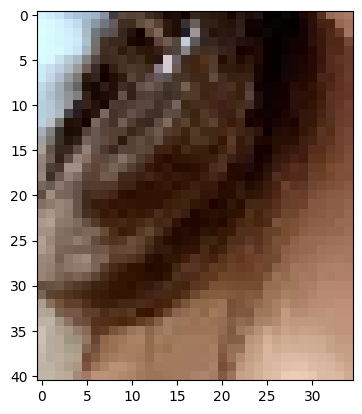

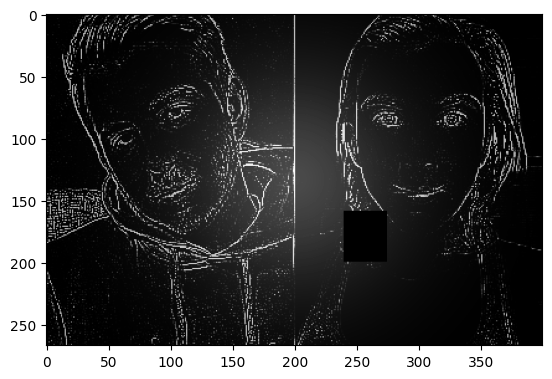

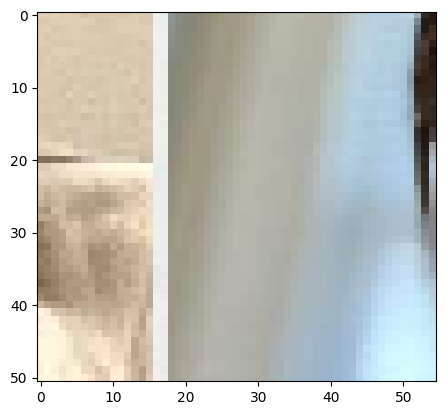

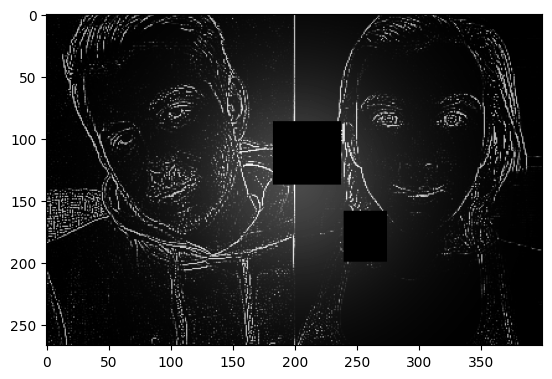

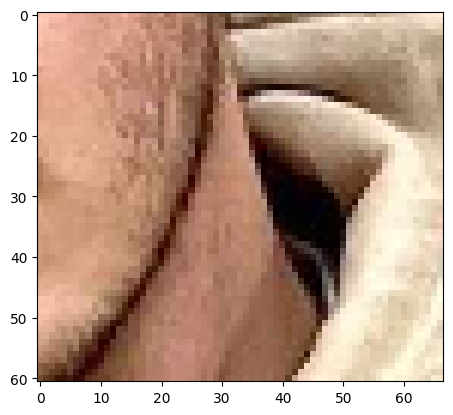

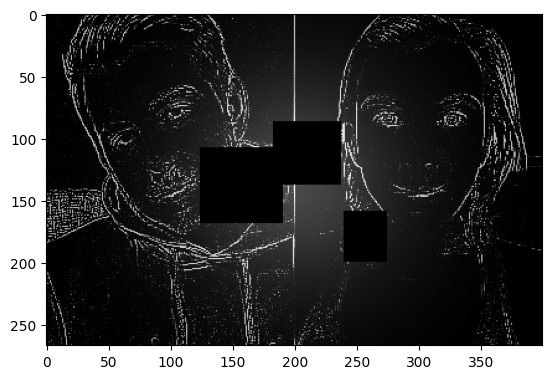

Duo Mantine and Remoraid.jpg


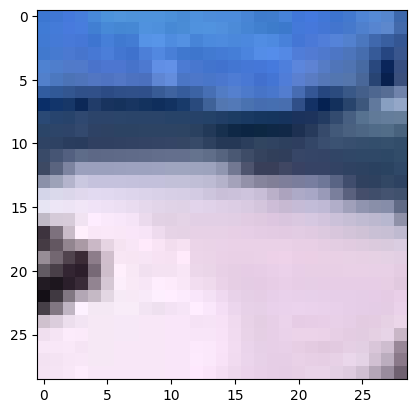

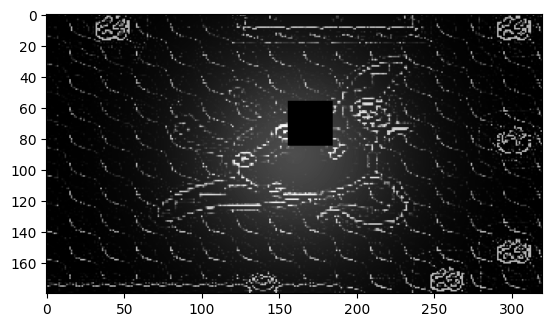

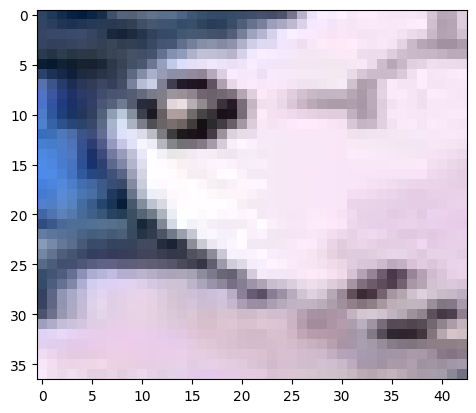

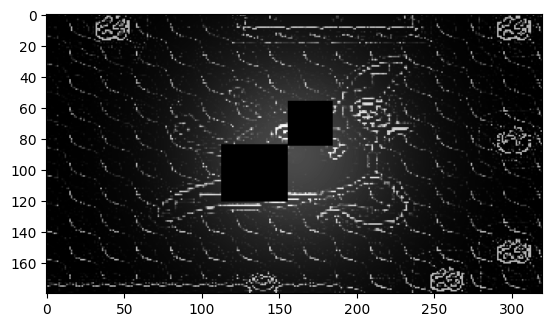

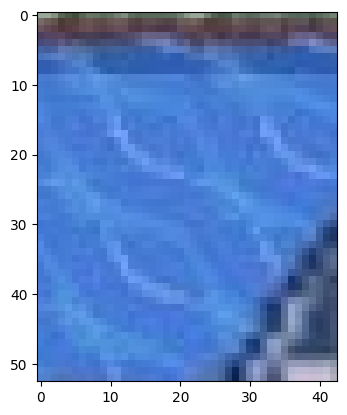

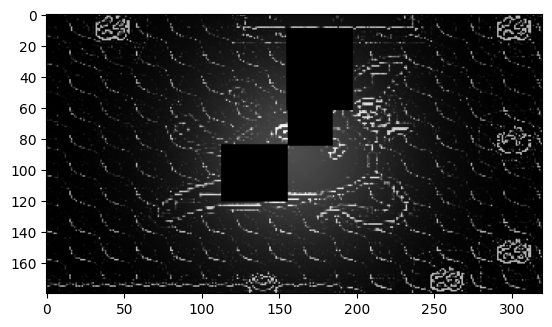

Character HL.jpg


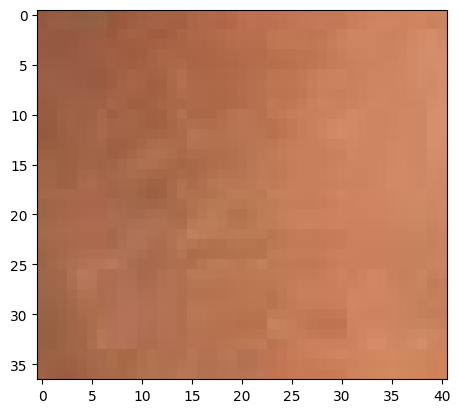

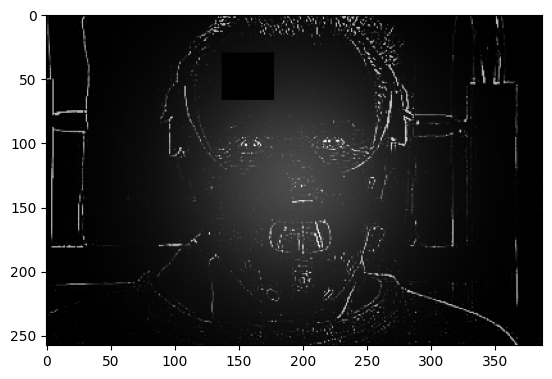

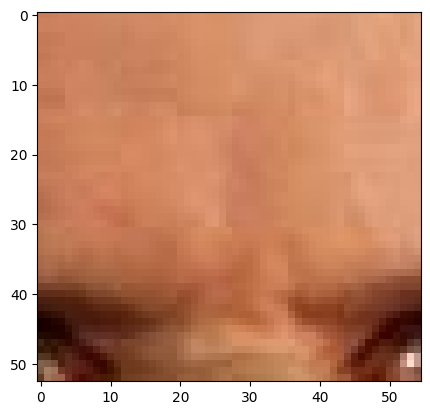

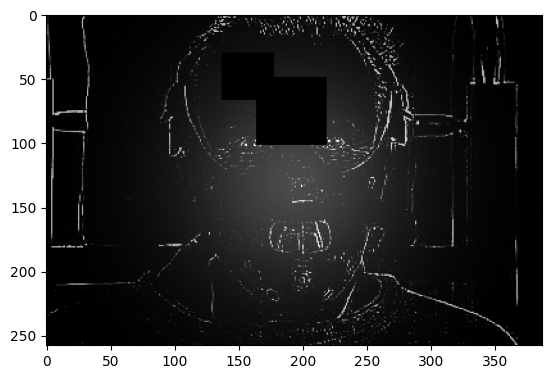

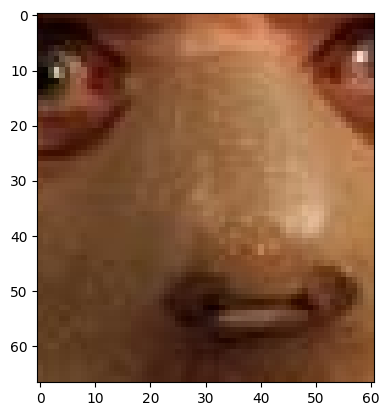

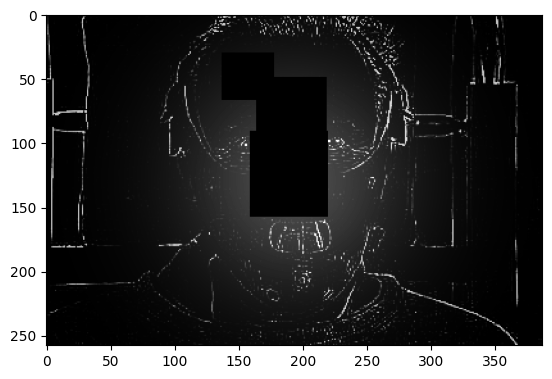

Character Android.png


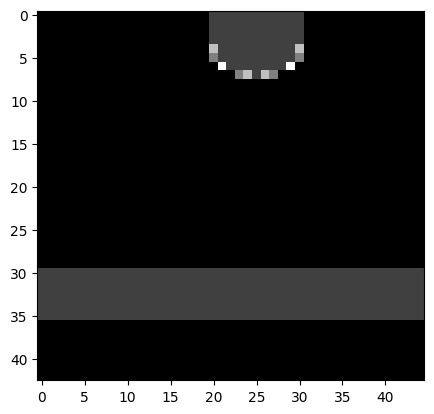

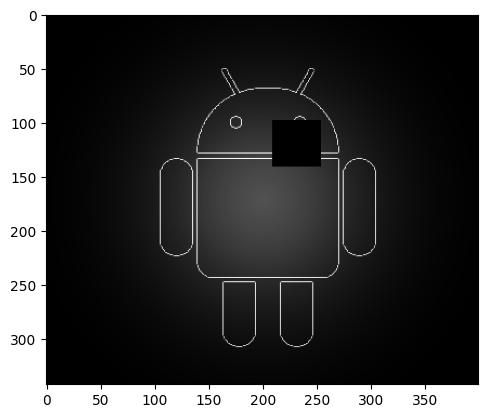

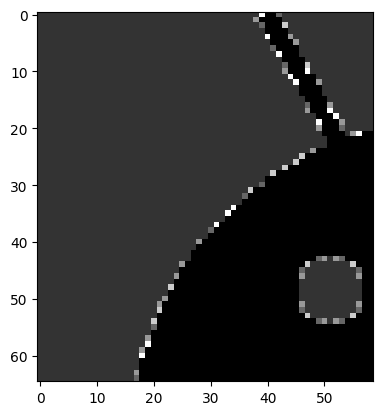

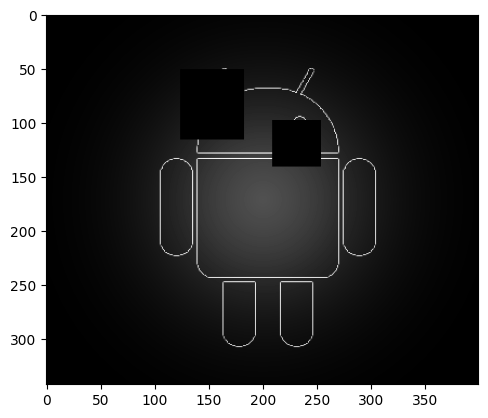

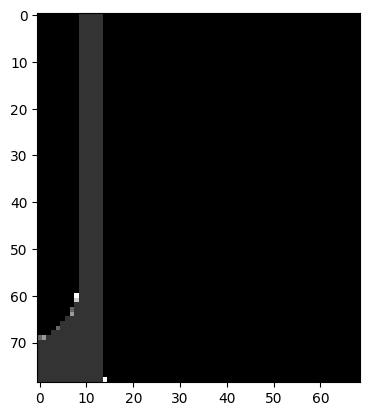

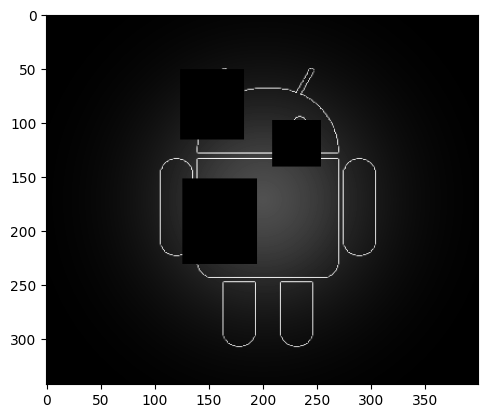

Cartoon Character TR.jpg


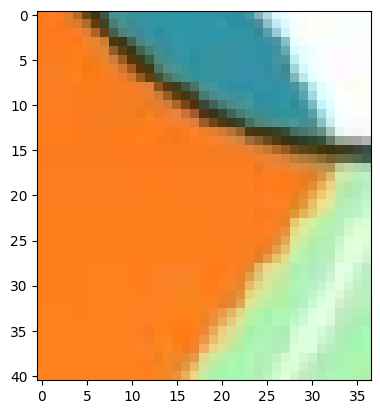

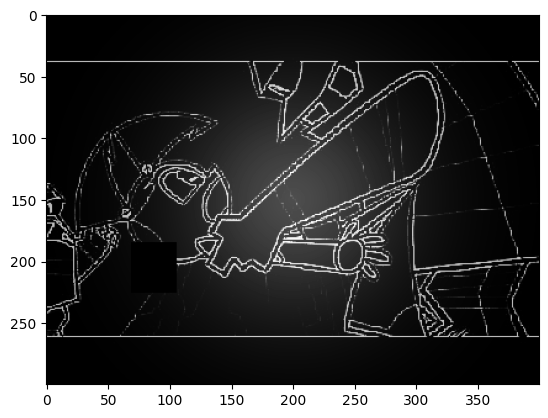

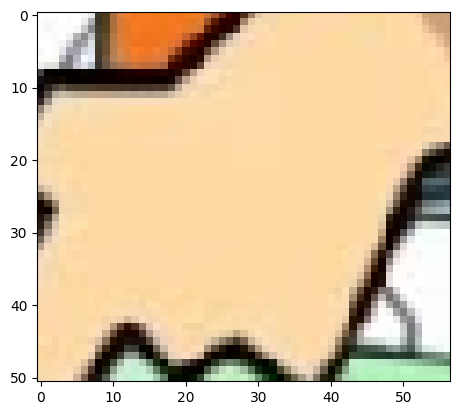

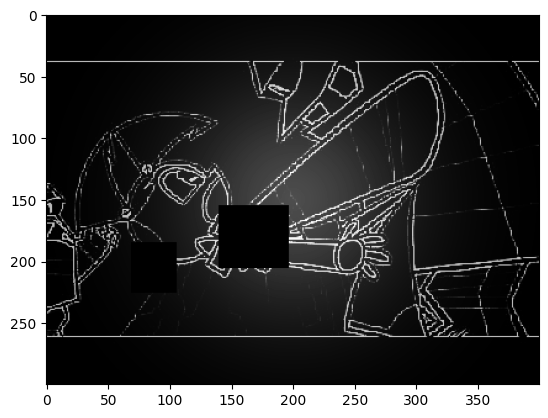

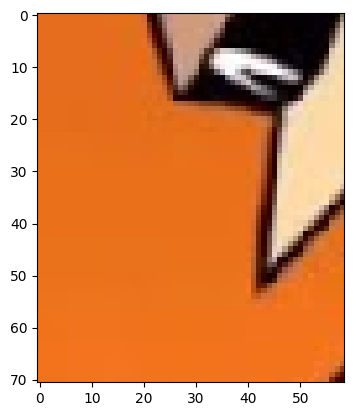

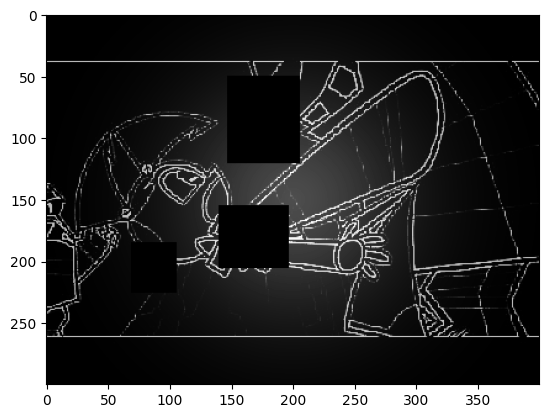

Weapon or Ability Disc.png


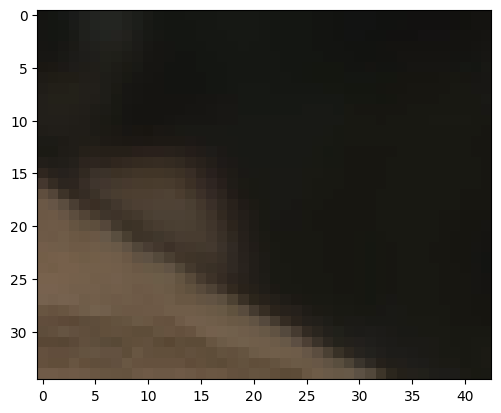

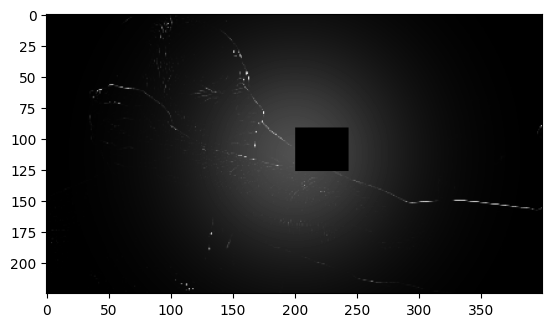

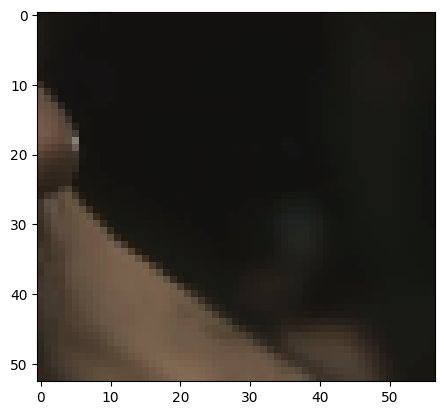

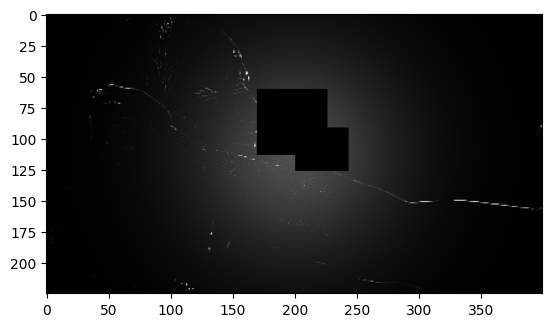

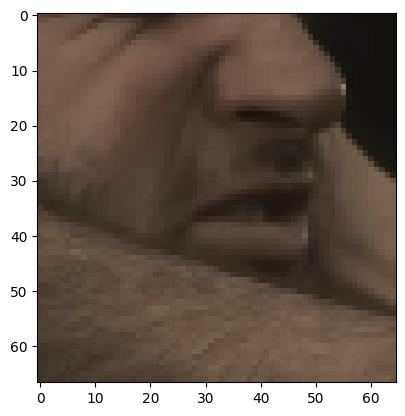

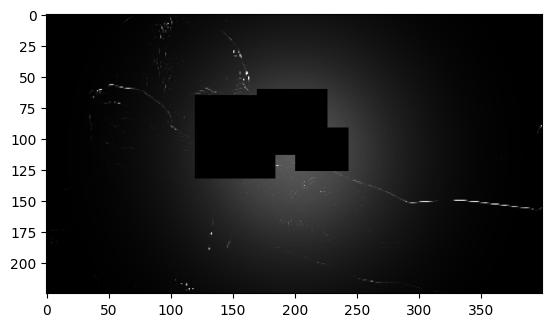

Anime Weapon or Ability TNJ.jpg


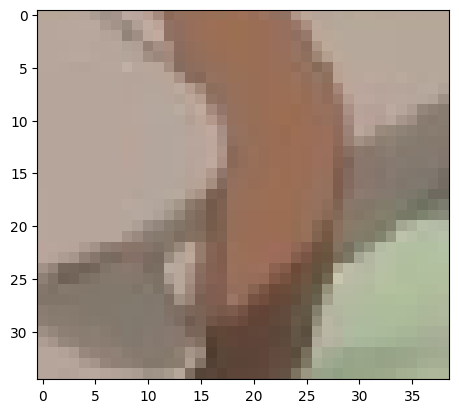

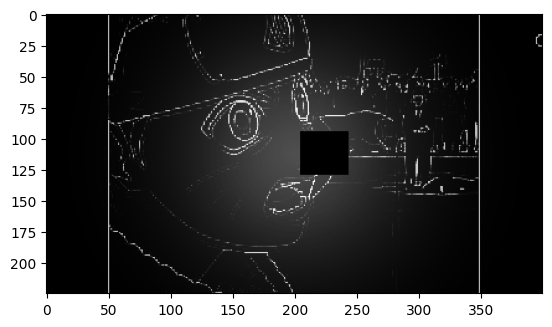

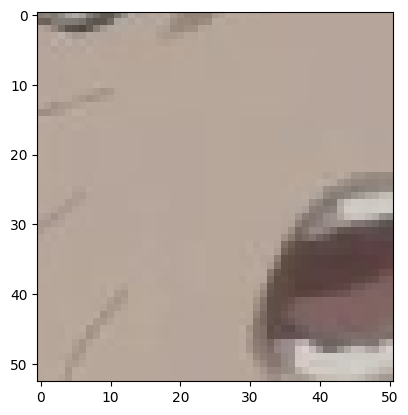

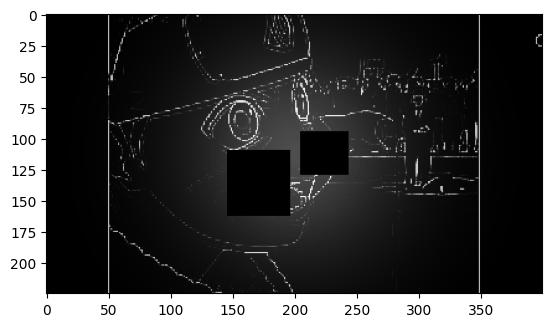

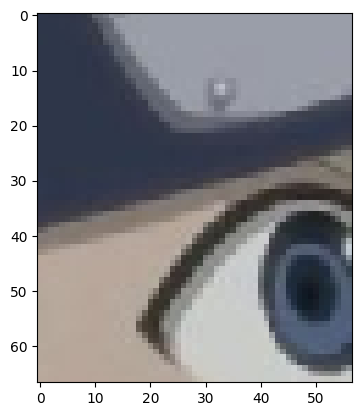

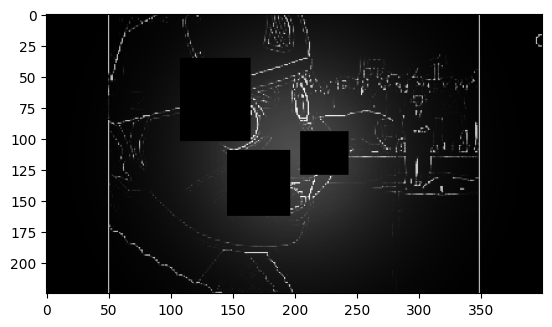

Duo CAB.jpg


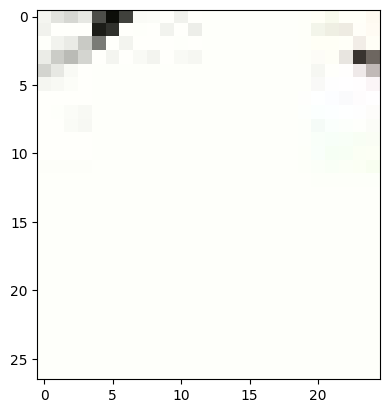

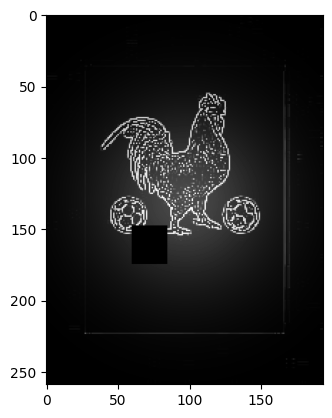

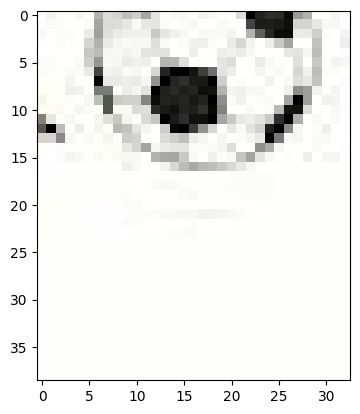

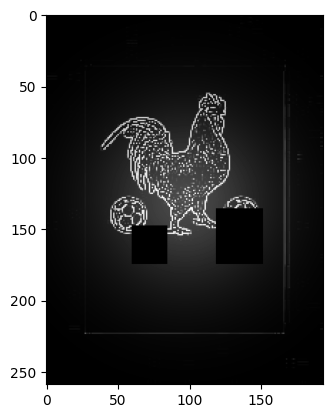

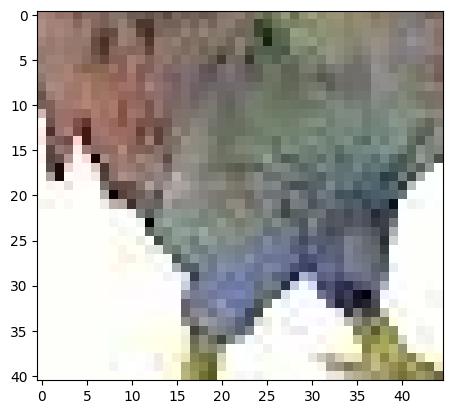

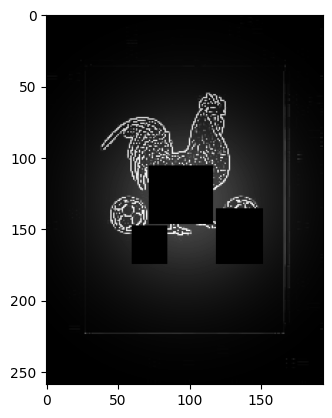

Cartoon Character LS.webp


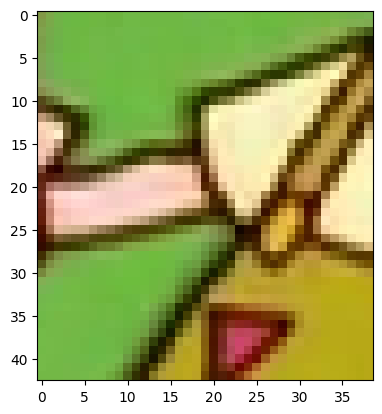

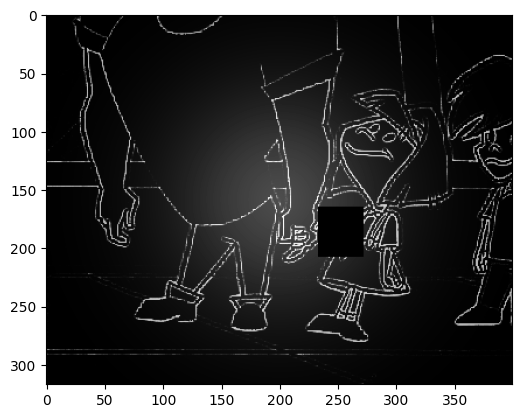

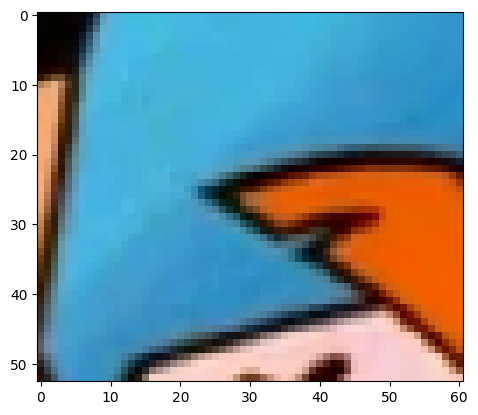

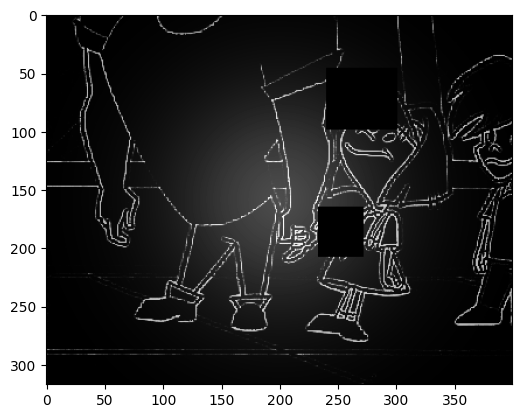

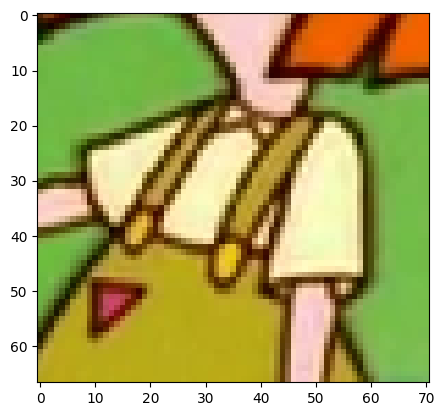

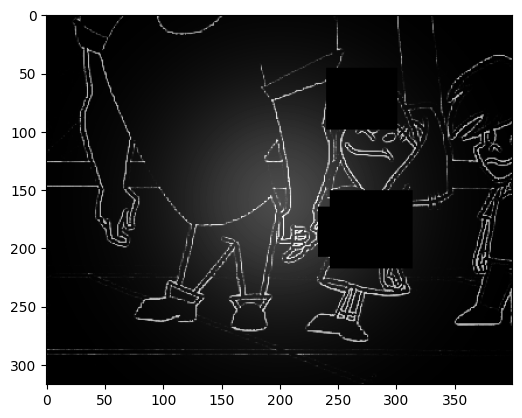

Title.webp
Cartoon Character CR.jpg


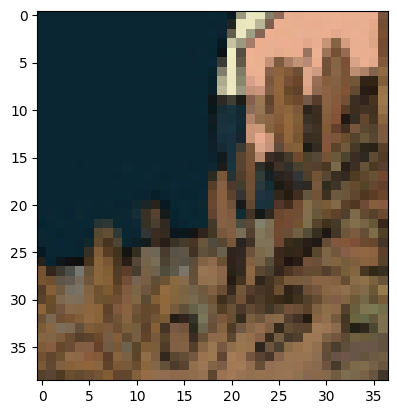

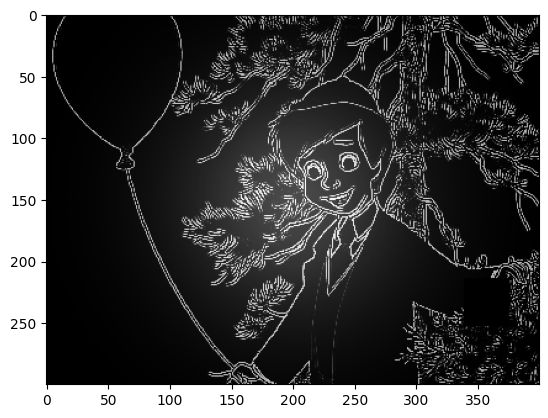

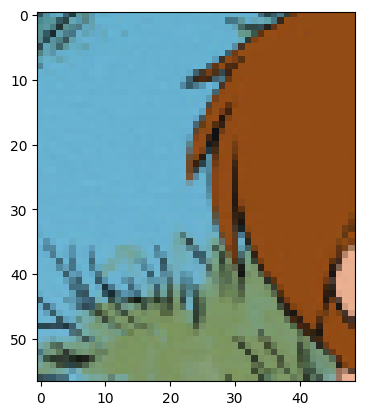

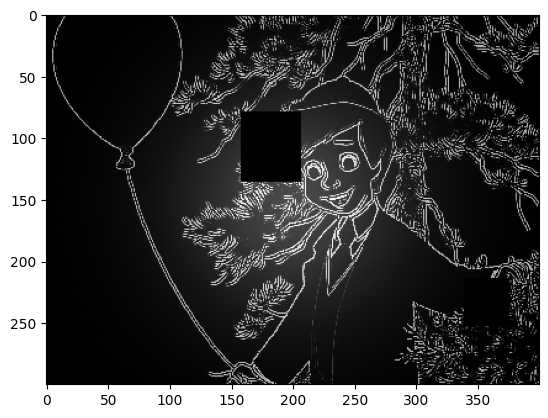

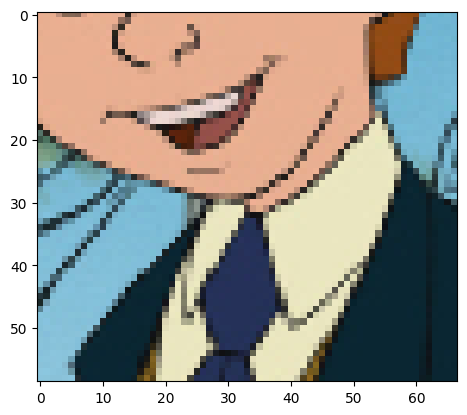

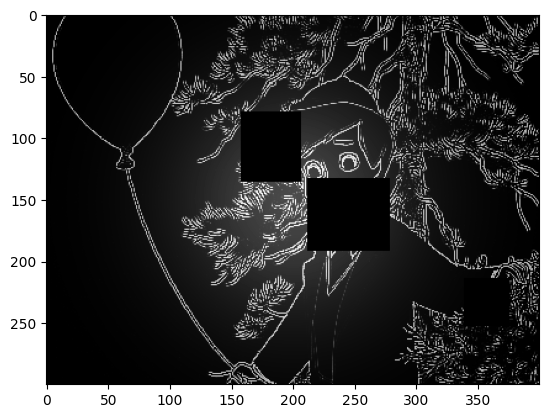

Character Rambo.webp


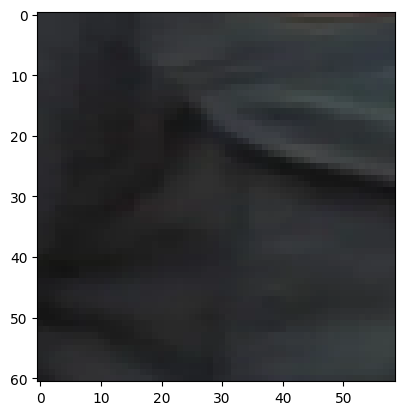

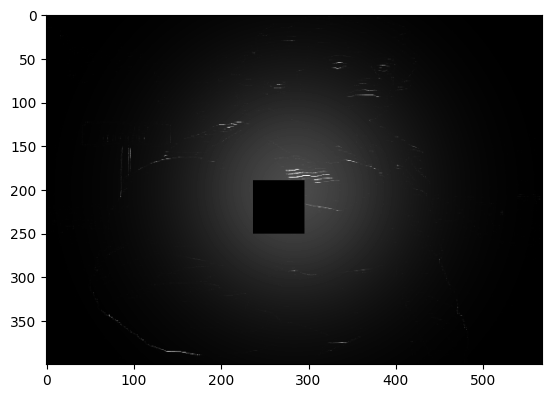

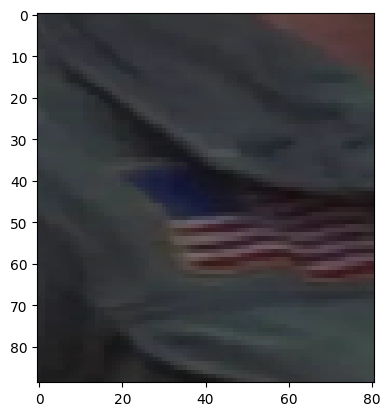

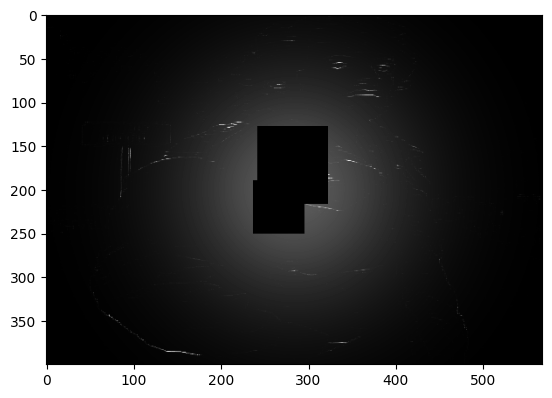

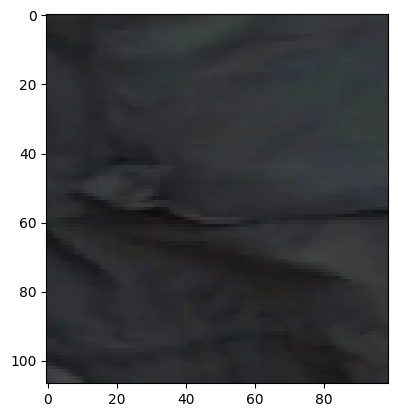

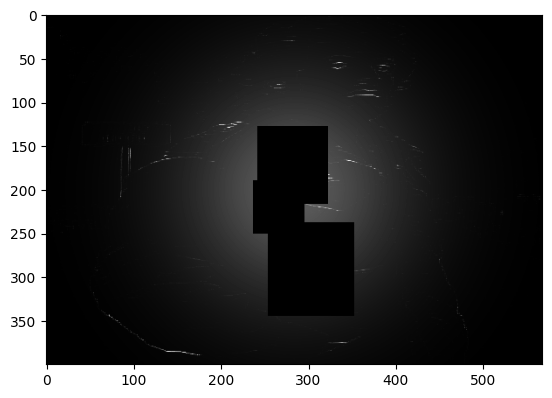

Anime Character CT.png


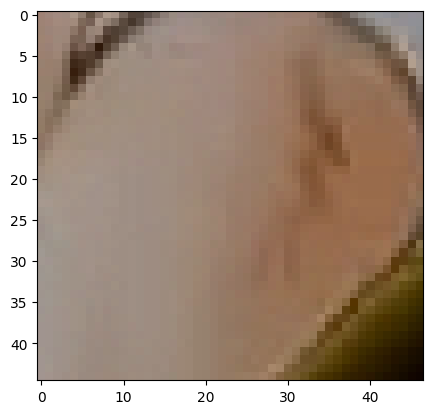

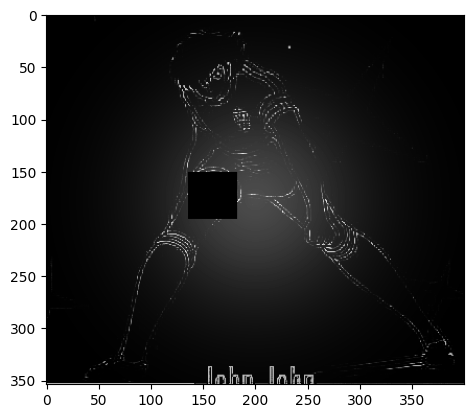

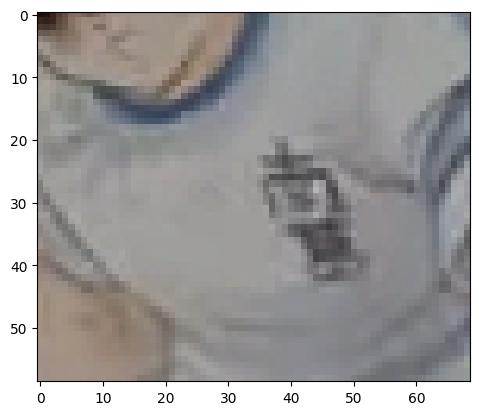

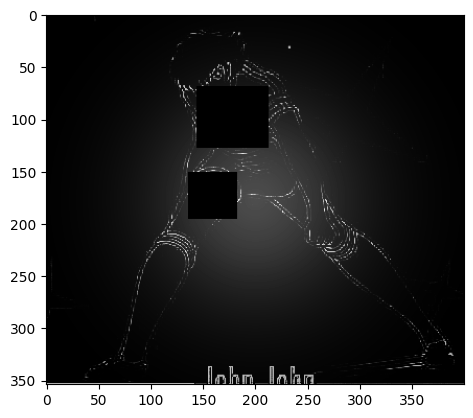

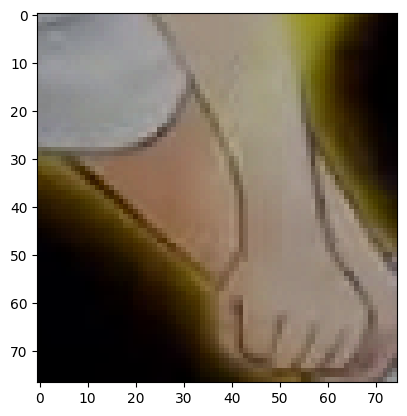

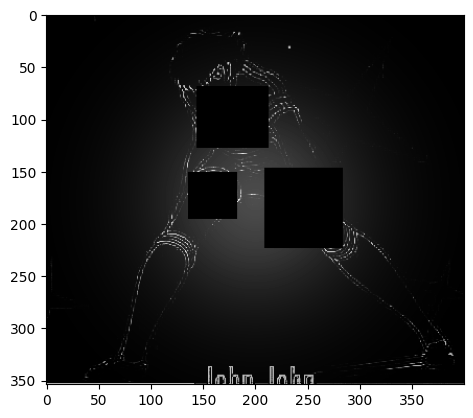

Pokemon MN.png


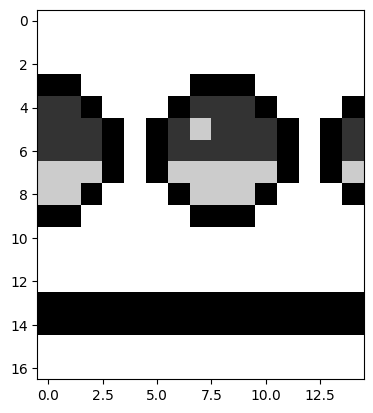

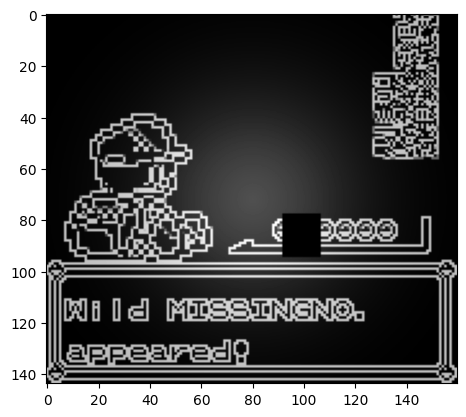

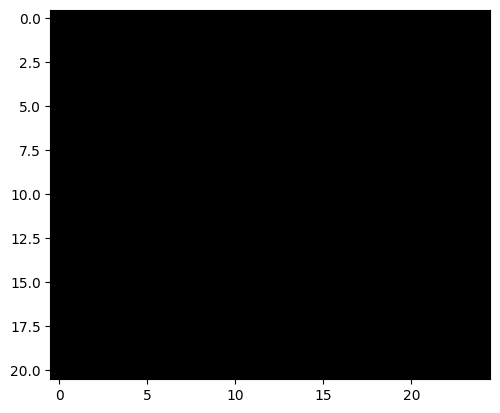

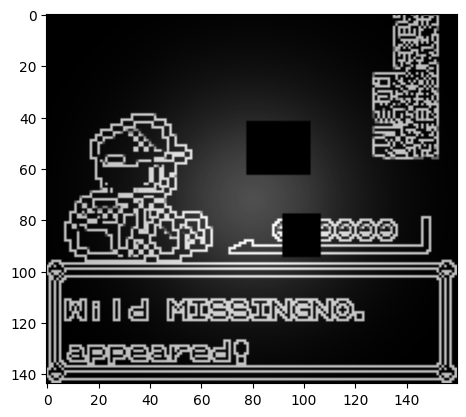

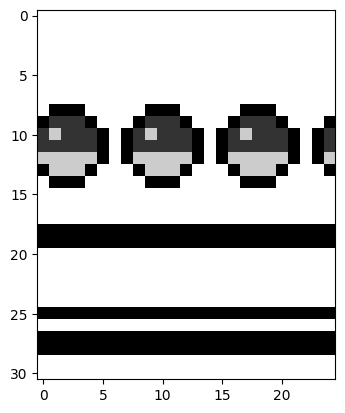

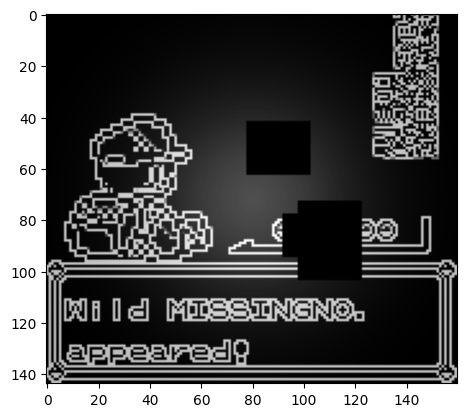

Cartoon Character Death.webp


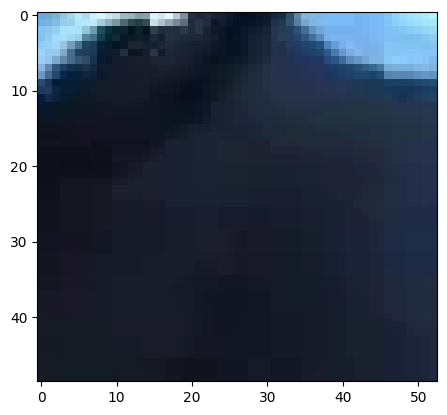

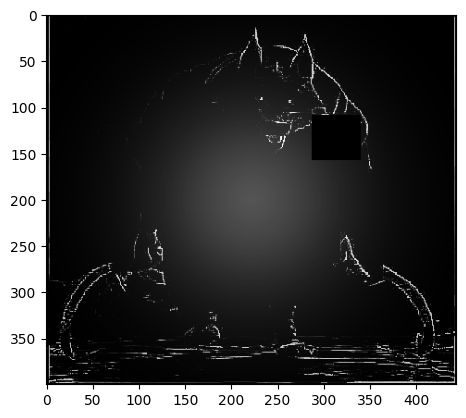

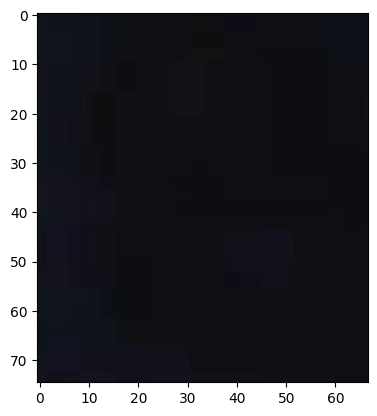

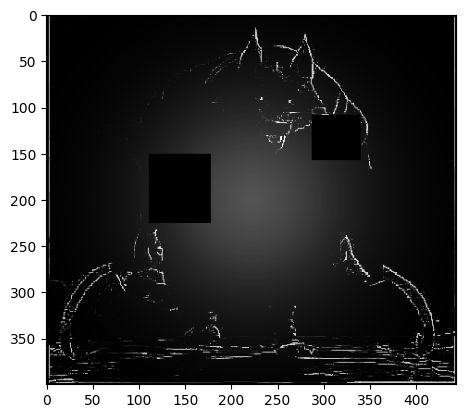

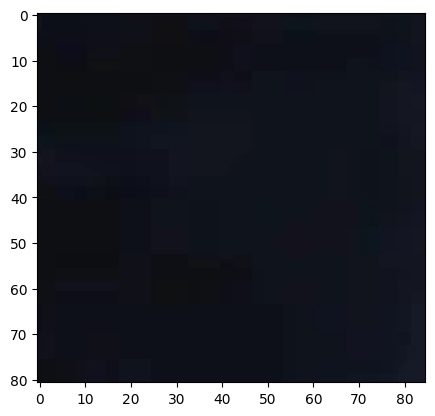

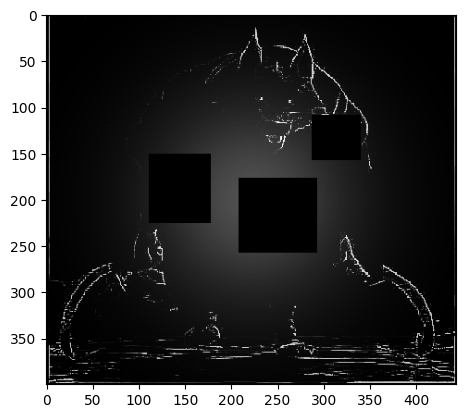

Character BT.webp


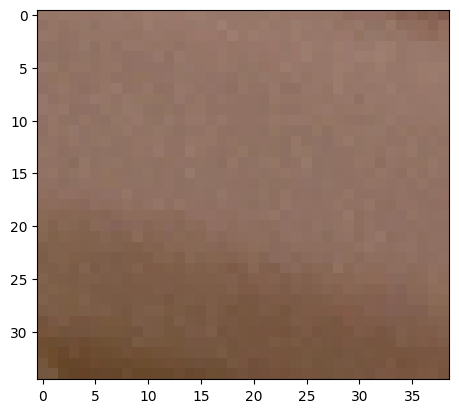

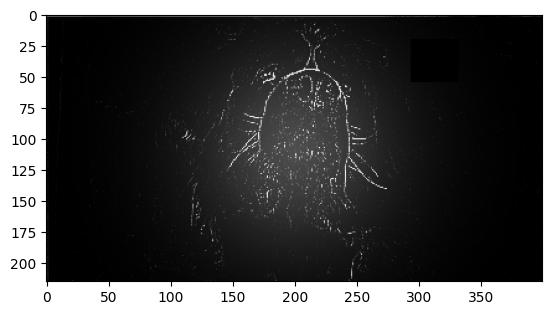

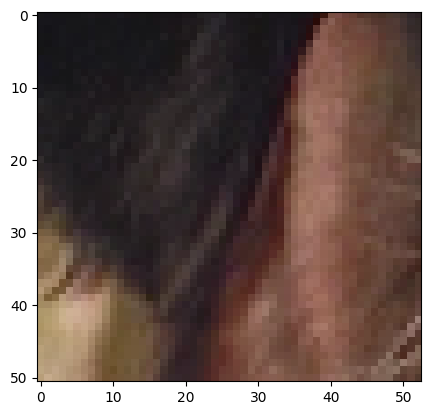

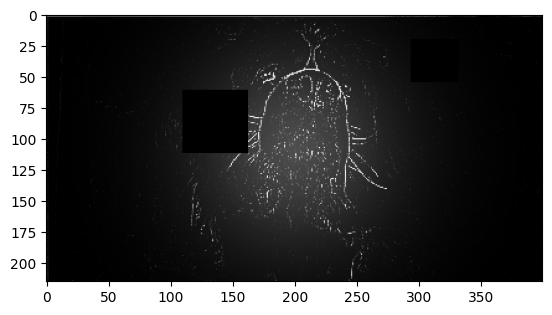

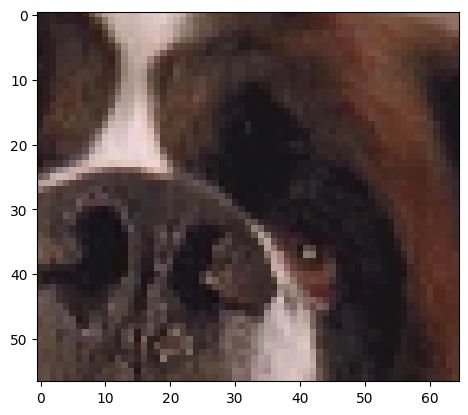

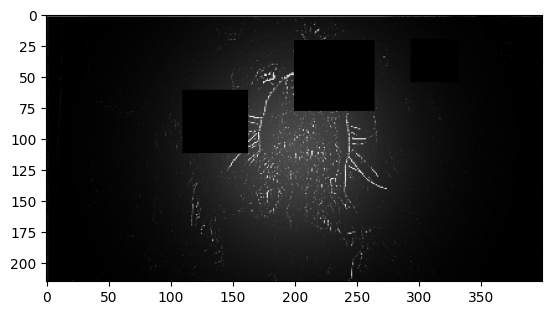

Anime Character CF.jpg


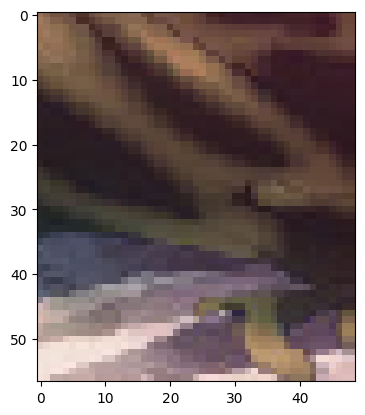

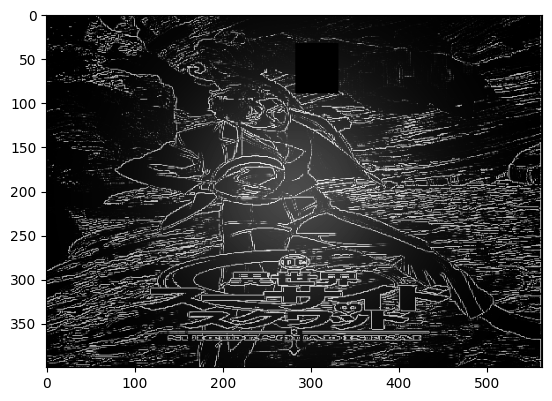

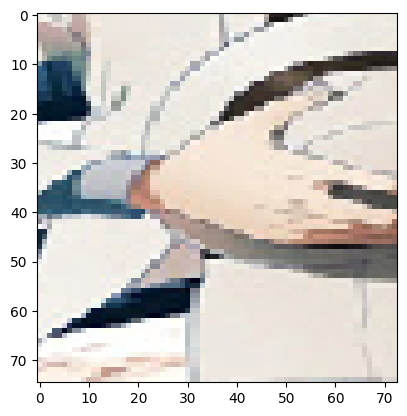

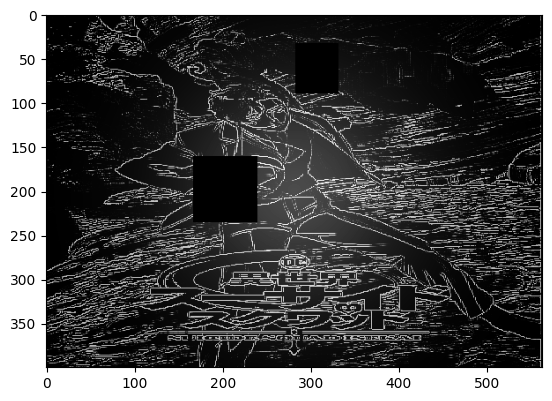

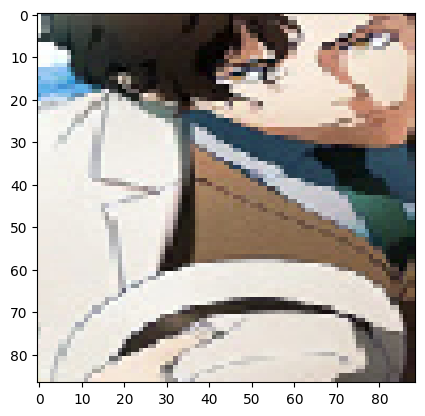

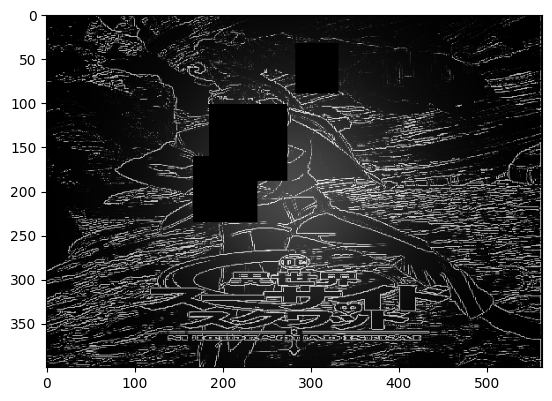

Scene KF2.png


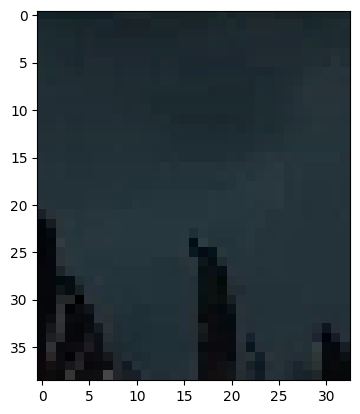

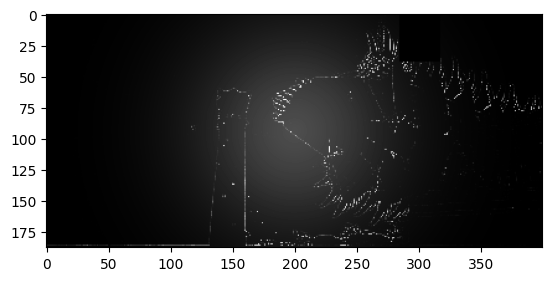

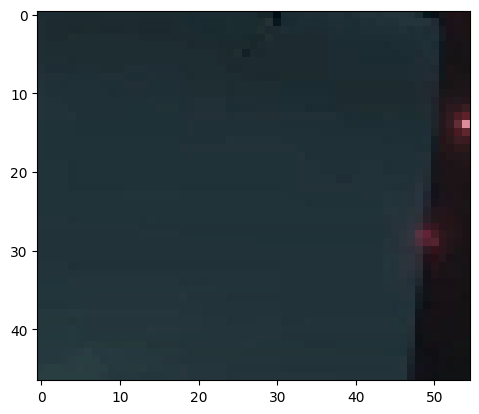

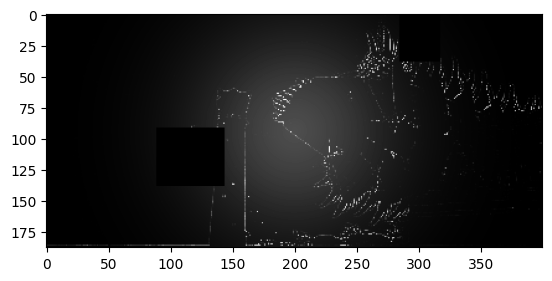

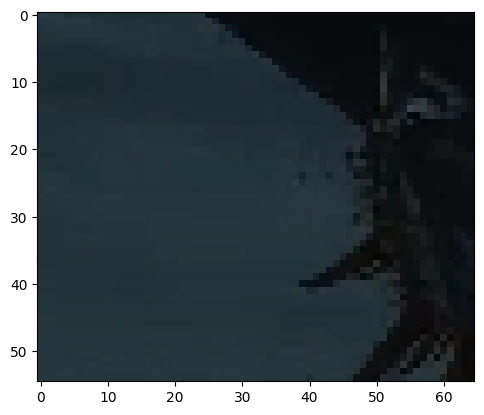

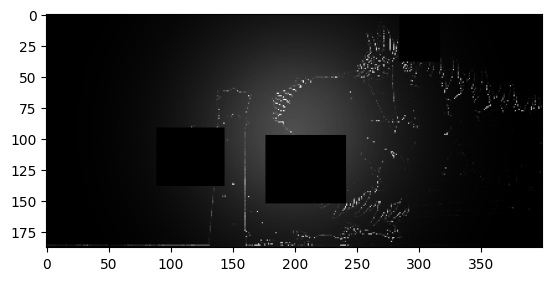

Anime Character GM.webp


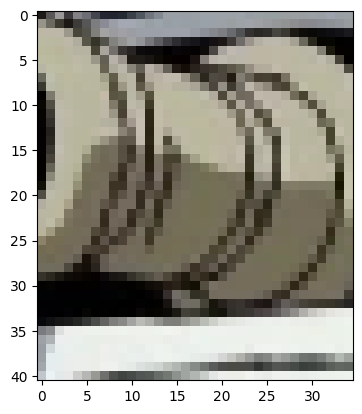

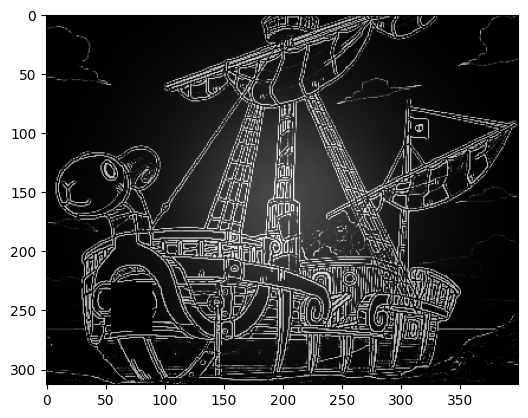

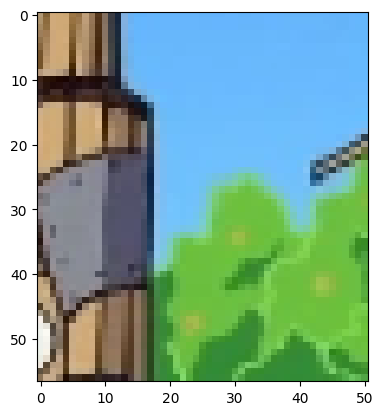

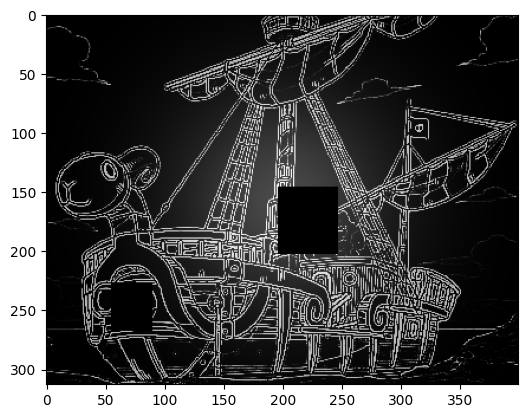

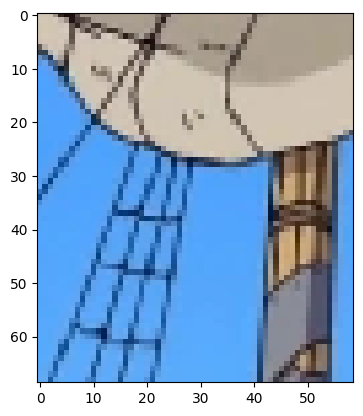

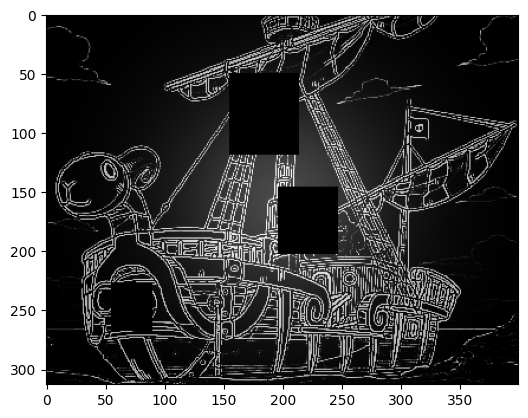

Famous Person AJ.jpg


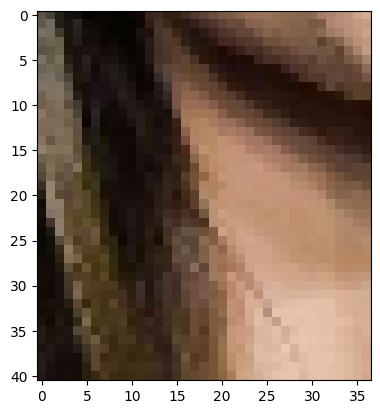

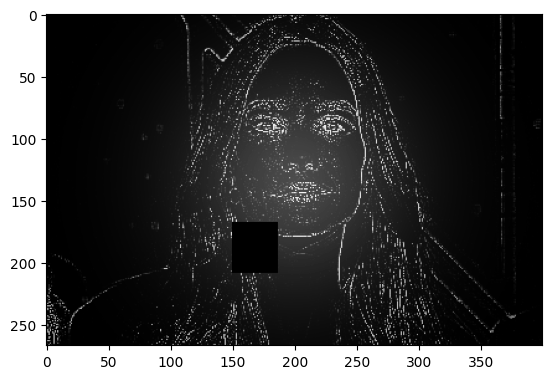

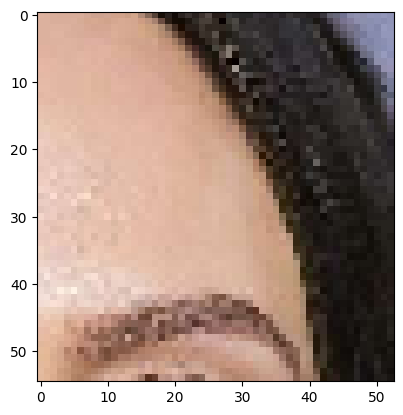

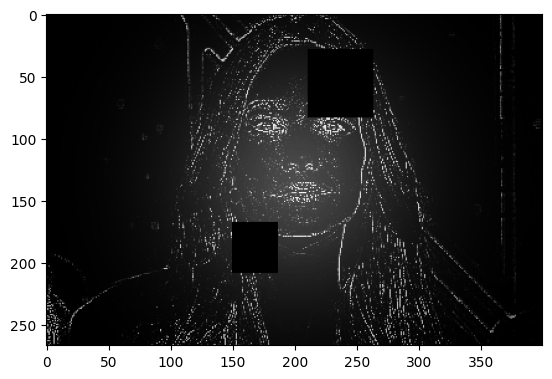

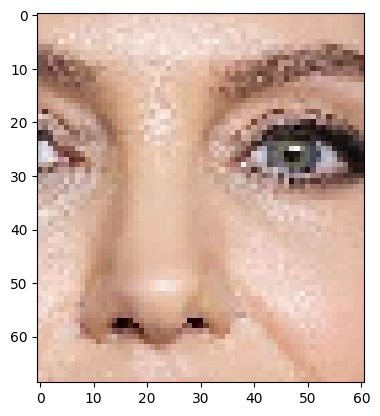

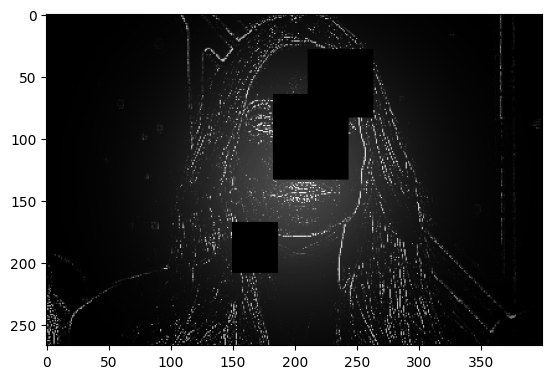

Anime Character FR.jpg


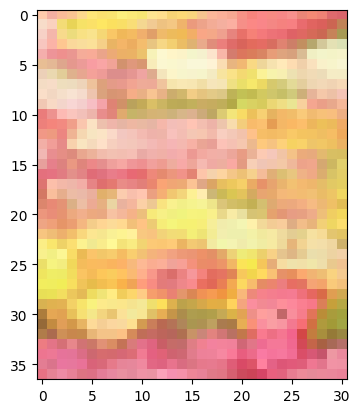

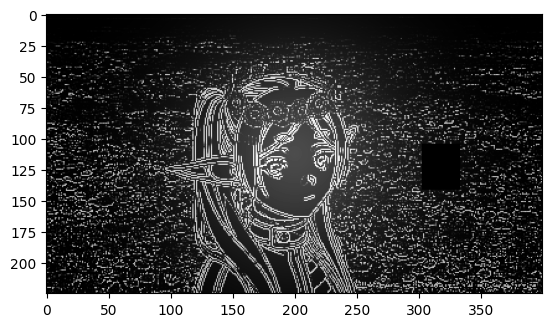

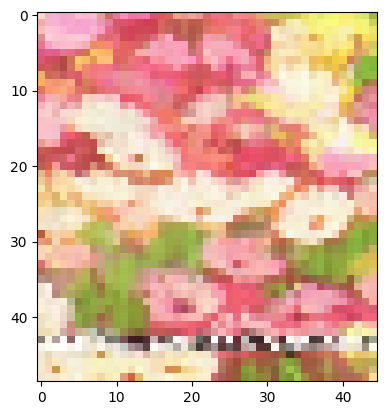

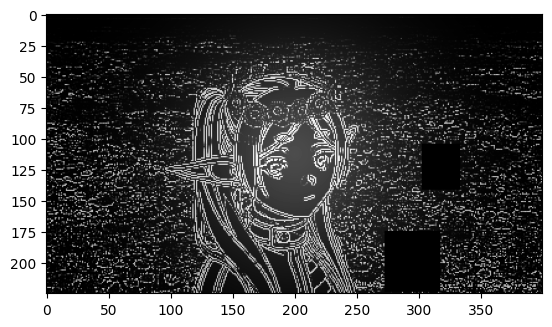

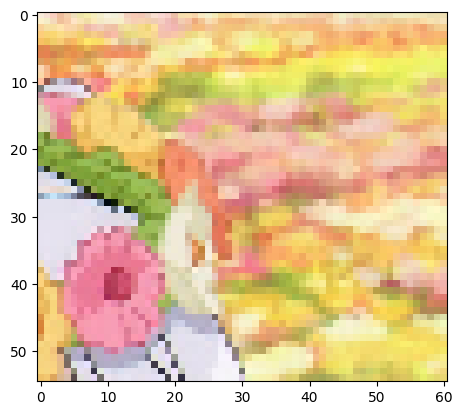

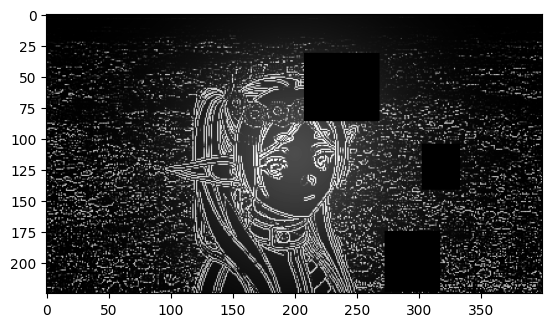

Famous Person GO.webp


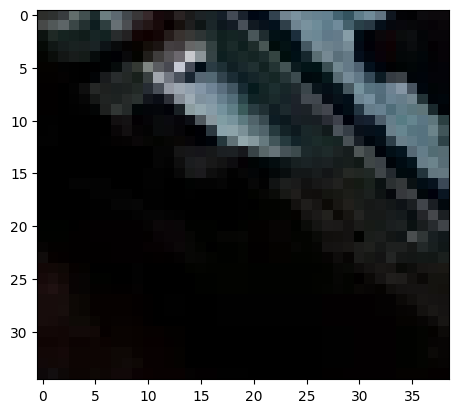

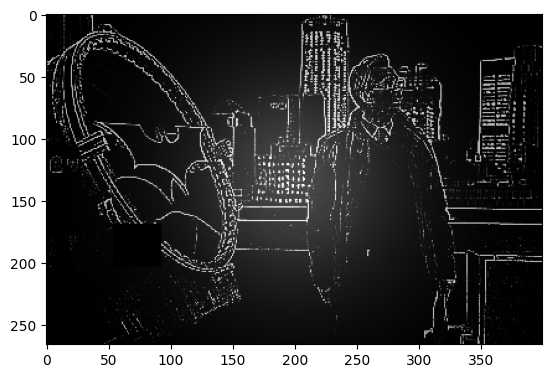

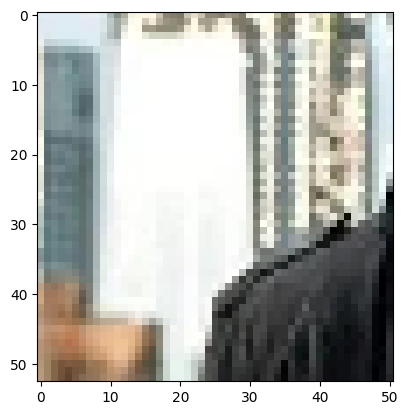

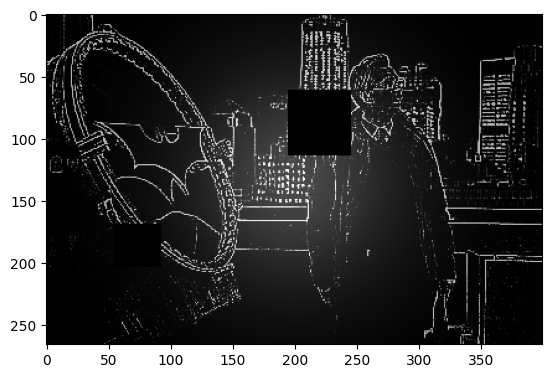

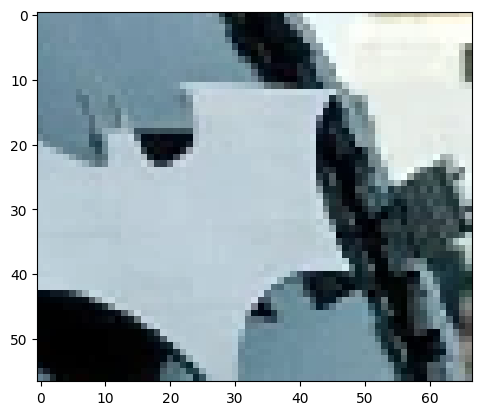

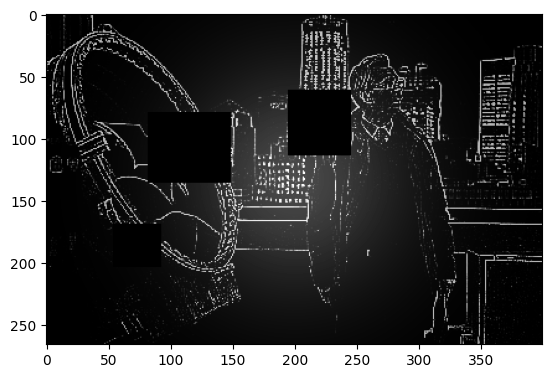

Character CY.jpg


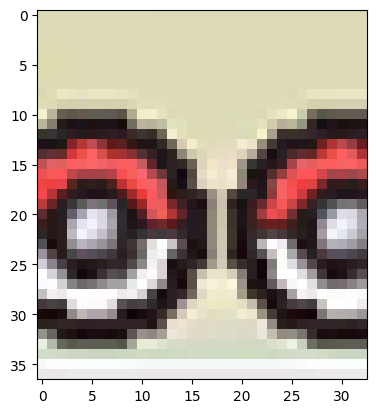

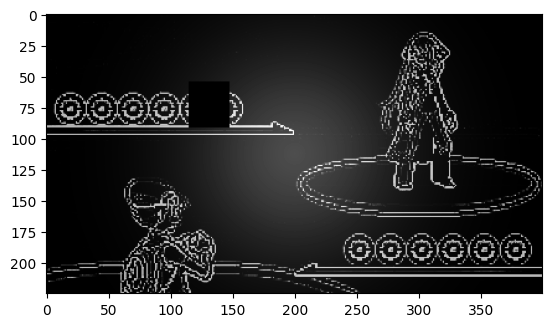

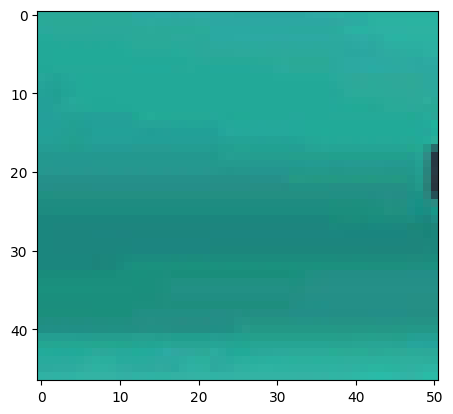

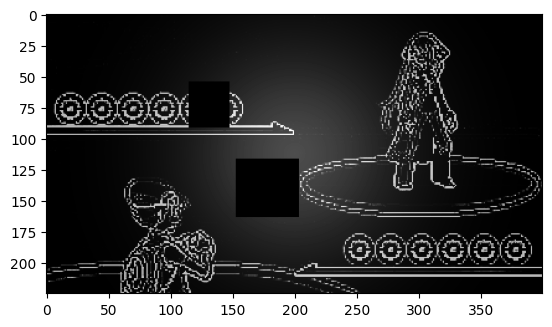

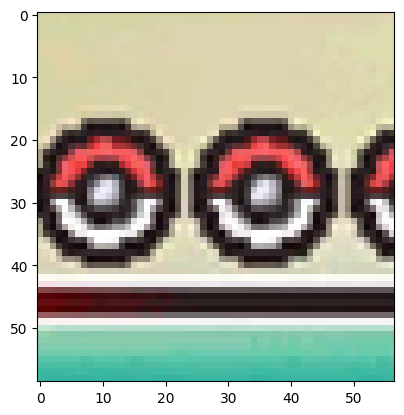

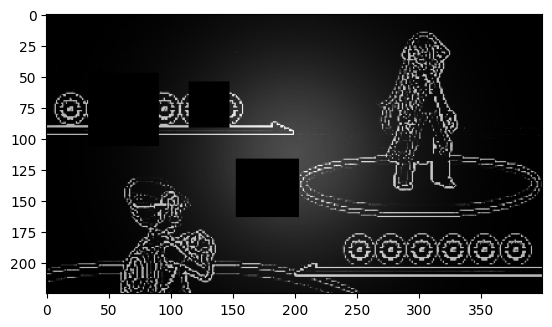

Location LN.webp


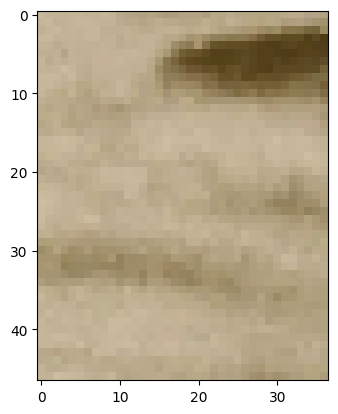

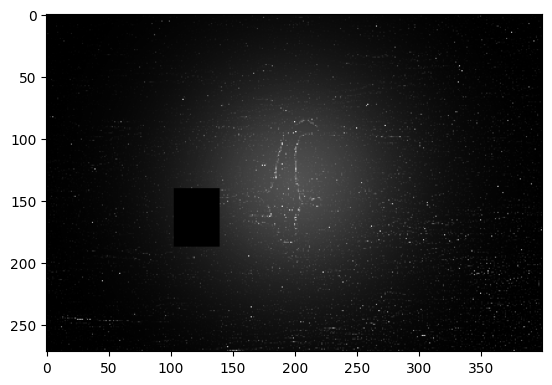

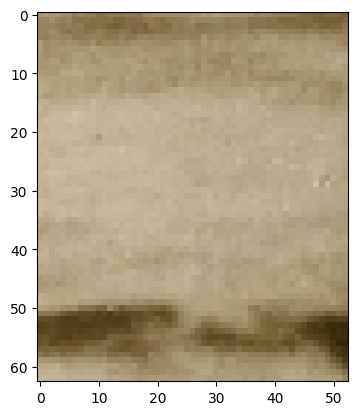

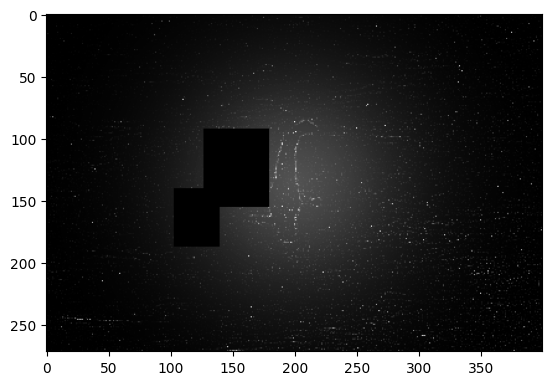

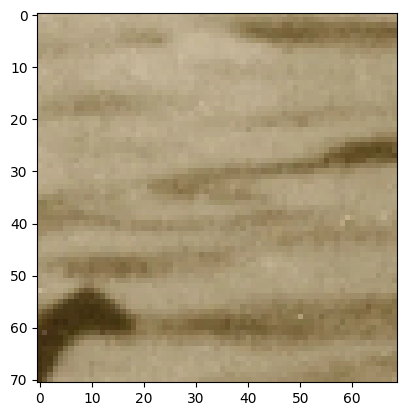

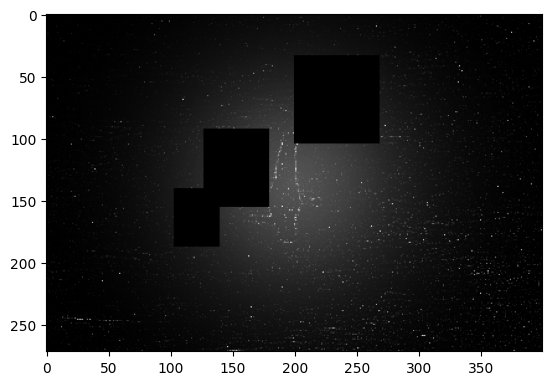

In [114]:
imgs = [img for img in os.listdir(imageDirectory)]
random.shuffle(imgs)
# divisors = [5, 4, 3]
numHints = 3

for imgName in imgs:
    print(imgName)
    imgPath = os.path.join(imageDirectory, imgName)
    imgFull = Image.open(imgPath)
    maxLength = 400
    img = imgFull.copy()
    # img = img.filter(ImageFilter.SHARPEN)
    if img.size[1] < img.size[0] and img.size[0] > maxLength:
        img = img.resize((maxLength, round(img.size[1] * (maxLength/img.size[0]))), Image.NEAREST)
    elif imgFull.size[1] > maxLength:
        img = img.resize((round(img.size[1] * (maxLength/img.size[0])), maxLength), Image.NEAREST)
    else:
        img = img
    slideName = determineSlideType(imgName)
    if slideName == SlideType.TITLE.value:
        addImageInCenter(titleSlide, img)
        newTitle = titleSlide.shapes.add_textbox(title.left, (quiz.slide_height-title.height)/2, title.width, title.height)
        newTitle.text = title.text
        newTitle.text_frame.paragraphs[0].font.color.rgb = pptx.dml.color.RGBColor.from_string("FFFFFF")
        newTitle.text_frame.fit_text(max_size=94)
        newTitle.text_frame.paragraphs[0].alignment = pptx.enum.text.PP_ALIGN.CENTER
        titleSlide.shapes.element.remove(title.element)
    else:
        if slideName is not None:
            categories.add(slideName)
        imgArray = np.asarray(img.convert("L"), dtype=np.int32)
        probabilityMatrix = np.zeros_like(imgArray, dtype=np.float64)
        probabilityMatrix += edgeDetection(imgArray)
        probabilityMatrix += centerBias(imgArray)
        prevCropData = []
        for cropIndex in range(numHints):
            # divisor = divisors[cropIndex]
            minProbPerc = cropIndex / (cropIndex+2)
            # chunkShape = calcChunkShape(imgArray.shape, divisor)
            chunkShape = calcChunkShape(probabilityMatrix, cropIndex)
            consolidatedVector = consolidate(probabilityMatrix, chunkShape, minProbPerc)
            chosenChunk = rng.choice(np.arange(len(consolidatedVector)), p=consolidatedVector)
            cropChunk = cropImage(img, chunkShape, chosenChunk, probabilityMatrix)
            imageSlide = quiz.slides.add_slide(quiz.slide_layouts[6])
            addImageInCenter(imageSlide, imgFull, cropChunk)
            for prevCropChunk in prevCropData:
                addImageInCenter(imageSlide, imgFull, prevCropChunk)
            prevCropData.append(cropChunk)
            addSlideLabel(imageSlide, slideName)

            # imageChunk = cutImage(img, chunkShape, chosenChunk, probabilityMatrix)
            # plt.imshow(np.asarray(imageChunk), cmap="gray")
            # plt.show()
            # plt.imshow(probabilityMatrix, cmap="gray")
            # plt.show()
        imageSlide = quiz.slides.add_slide(quiz.slide_layouts[6])
        addImageInCenter(imageSlide, imgFull)
        addSlideLabel(imageSlide, slideName)

In [115]:
if len(categories) == 0:
    bulletPoint = categoriesTextFrame.add_paragraph()
    bulletPoint.text = "secret"
    bulletPoint.level = 1
else:
    def checkForAnimeAndNon(categories):
        anime = False
        nonanime = False
        for slideType in categories:
            if animeString in slideType:
                anime = True
            else:
                nonanime = True
            if anime and nonanime:
                return True
        return False
    multiCategories = checkForAnimeAndNon(categories)
    if multiCategories:
        categoryPoint = categoriesTextFrame.add_paragraph()
        categoryPoint.text = "Anime:"
        categoryPoint.level = 1
        level = 2
    else:
        level = 1
    for slideType in categories:
        if animeString in slideType:
            categoryPoint = categoriesTextFrame.add_paragraph()
            categoryPoint.text = slideType[(len(animeString)):]
            categoryPoint.level = level
    if multiCategories:
        categoryPoint = categoriesTextFrame.add_paragraph()
        categoryPoint.text = "Non-Anime (denoted by not mentioning anime):"
        categoryPoint.level = 1
    for slideType in categories:
        if animeString not in slideType:
            categoryPoint = categoriesTextFrame.add_paragraph()
            categoryPoint.text = slideType
            categoryPoint.level = level

In [116]:
quiz.save(outputDirectory + "/quiz.pptx")